In [16]:
%load_ext autoreload
%autoreload 2
import dgl
import torch
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. Carga y Configuración Inicial

In [17]:
%load_ext autoreload
%autoreload 2

import os
import dgl
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from collections import Counter

# Configuración de estilo
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Configuración de impresión
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

print("✓ Librerías importadas correctamente")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
✓ Librerías importadas correctamente


In [11]:
# Ruta al grafo DGL
# ---------------------
GRAPH_PATH = '/media/valentina/KINGSTON/TESIS/data/dgl_graph/2024/peeringdb/'

In [18]:
# Cargar el grafo DGL
try:
    dgl_graph = dgl.data.CSVDataset(GRAPH_PATH, force_reload=True)
    g = dgl_graph[0]  # Primer grafo de la lista
    print("✓ Grafo cargado desde graph.bin")
except:
    print("✗ Error al cargar el grafo. Verifica el formato del archivo.")
    g = None

if g is not None:
    print(f"\nGrafo cargado exitosamente:")
    print(g)

Done saving data into cached files.
✓ Grafo cargado desde graph.bin

Grafo cargado exitosamente:
Graph(num_nodes=41423, num_edges=3332036,
      ndata_schemes={'feat': Scheme(shape=(68,), dtype=torch.float32)}
      edata_schemes={})


## 2. Estadísticas Básicas del Grafo

In [19]:
if g is not None:
    # Información básica
    num_nodes = g.num_nodes()
    num_edges = g.num_edges()
    
    print("=" * 70)
    print("ESTADÍSTICAS BÁSICAS DEL GRAFO")
    print("=" * 70)
    print(f"\n📊 Estructura:")
    print(f"   • Número de nodos (ASes): {num_nodes:,}")
    print(f"   • Número de aristas: {num_edges:,}")
    print(f"   • Tipo de grafo: {'Dirigido' if g.is_multigraph == False else 'Multi-grafo'}")
    
    # Densidad del grafo
    max_edges = num_nodes * (num_nodes - 1)  # para grafo dirigido
    density = num_edges / max_edges if max_edges > 0 else 0
    print(f"   • Densidad del grafo: {density:.6f}")
    print(f"   • Aristas posibles: {max_edges:,}")
    print(f"   • Porcentaje de conexión: {(density * 100):.4f}%")
    
    # Grados
    in_degrees = g.in_degrees().numpy()
    out_degrees = g.out_degrees().numpy()
    
    print(f"\n📈 Estadísticas de Grado:")
    print(f"   Grado de entrada:")
    print(f"      - Promedio: {in_degrees.mean():.2f}")
    print(f"      - Mediana: {np.median(in_degrees):.2f}")
    print(f"      - Mínimo: {in_degrees.min()}")
    print(f"      - Máximo: {in_degrees.max()}")
    print(f"      - Desviación estándar: {in_degrees.std():.2f}")
    
    print(f"   Grado de salida:")
    print(f"      - Promedio: {out_degrees.mean():.2f}")
    print(f"      - Mediana: {np.median(out_degrees):.2f}")
    print(f"      - Mínimo: {out_degrees.min()}")
    print(f"      - Máximo: {out_degrees.max()}")
    print(f"      - Desviación estándar: {out_degrees.std():.2f}")
    
    # Nodos aislados
    isolated_nodes = ((in_degrees == 0) & (out_degrees == 0)).sum()
    print(f"\n🔍 Conectividad:")
    print(f"   • Nodos aislados: {isolated_nodes} ({(isolated_nodes/num_nodes*100):.2f}%)")
    print(f"   • Nodos con al menos una conexión: {num_nodes - isolated_nodes} ({((num_nodes-isolated_nodes)/num_nodes*100):.2f}%)")

ESTADÍSTICAS BÁSICAS DEL GRAFO

📊 Estructura:
   • Número de nodos (ASes): 41,423
   • Número de aristas: 3,332,036
   • Tipo de grafo: Multi-grafo
   • Densidad del grafo: 0.001942
   • Aristas posibles: 1,715,823,506
   • Porcentaje de conexión: 0.1942%

📈 Estadísticas de Grado:
   Grado de entrada:
      - Promedio: 80.44
      - Mediana: 19.00
      - Mínimo: 0
      - Máximo: 171198
      - Desviación estándar: 1656.10
   Grado de salida:
      - Promedio: 80.44
      - Mediana: 0.00
      - Mínimo: 0
      - Máximo: 171150
      - Desviación estándar: 1729.31

🔍 Conectividad:
   • Nodos aislados: 0 (0.00%)
   • Nodos con al menos una conexión: 41423 (100.00%)


## 3. Análisis de Atributos de Nodos

In [37]:
if g is not None:
    print("=" * 70)
    print("ATRIBUTOS DE NODOS")
    print("=" * 70)
    
    # Listar todos los atributos disponibles
    node_attrs = g.ndata.keys()
    print(f"\n📋 Atributos disponibles: {list(node_attrs)}")
    
    # Analizar cada atributo
    for attr_name in node_attrs:
        attr_data = g.ndata[attr_name]
        print(f"\n🔹 {attr_name}:")
        print(f"   • Tipo: {attr_data.dtype}")
        print(f"   • Shape: {attr_data.shape}")
        
        if len(attr_data.shape) == 1:  # Atributo escalar
            print(f"   • Valores únicos: {len(torch.unique(attr_data))}")
            if attr_data.dtype in [torch.float32, torch.float64]:
                print(f"   • Min: {attr_data.min().item():.4f}")
                print(f"   • Max: {attr_data.max().item():.4f}")
                print(f"   • Media: {attr_data.float().mean().item():.4f}")
                print(f"   • Std: {attr_data.float().std().item():.4f}")
        else:  # Atributo vectorial (features)
            print(f"   • Dimensionalidad: {attr_data.shape[1]}")
            print(f"   • Rango de valores: [{attr_data.min().item():.4f}, {attr_data.max().item():.4f}]")

ATRIBUTOS DE NODOS

📋 Atributos disponibles: ['feat']

🔹 feat:
   • Tipo: torch.float32
   • Shape: torch.Size([41423, 68])
   • Dimensionalidad: 68
   • Rango de valores: [0.0000, 1.0000]


In [38]:
# Si existe el atributo 'feat', analizar en detalle
if g is not None and 'feat' in g.ndata:
    features = g.ndata['feat'].numpy()
    
    print("\n" + "=" * 70)
    print("ANÁLISIS DETALLADO DE FEATURES")
    print("=" * 70)
    
    print(f"\n📊 Dimensiones: {features.shape}")
    print(f"   • {features.shape[0]} nodos")
    print(f"   • {features.shape[1]} características por nodo")
    
    # Estadísticas por dimensión
    print(f"\n📈 Estadísticas por dimensión de feature:")
    for i in range(min(10, features.shape[1])):  # Mostrar solo primeras 10
        feat_dim = features[:, i]
        print(f"   Dim {i}: μ={feat_dim.mean():.4f}, σ={feat_dim.std():.4f}, "
              f"min={feat_dim.min():.4f}, max={feat_dim.max():.4f}")
    
    if features.shape[1] > 10:
        print(f"   ... ({features.shape[1] - 10} dimensiones más)")
    
    # Verificar normalización
    is_normalized = np.allclose(features.mean(axis=0), 0, atol=0.1) and \
                    np.allclose(features.std(axis=0), 1, atol=0.2)
    print(f"\n✓ Features {'parecen estar' if is_normalized else 'NO están'} normalizadas")


ANÁLISIS DETALLADO DE FEATURES

📊 Dimensiones: (41423, 68)
   • 41423 nodos
   • 68 características por nodo

📈 Estadísticas por dimensión de feature:
   Dim 0: μ=0.0407, σ=0.0961, min=0.0000, max=1.0000
   Dim 1: μ=0.0328, σ=0.0874, min=0.0000, max=1.0000
   Dim 2: μ=0.0629, σ=0.1399, min=0.0000, max=1.0000
   Dim 3: μ=0.0446, σ=0.1216, min=0.0000, max=0.9956
   Dim 4: μ=0.0750, σ=0.2634, min=0.0000, max=1.0000
   Dim 5: μ=0.0186, σ=0.1352, min=0.0000, max=1.0000
   Dim 6: μ=0.0087, σ=0.0927, min=0.0000, max=1.0000
   Dim 7: μ=0.0788, σ=0.2695, min=0.0000, max=1.0000
   Dim 8: μ=0.0256, σ=0.1580, min=0.0000, max=1.0000
   Dim 9: μ=0.0885, σ=0.2840, min=0.0000, max=1.0000
   ... (58 dimensiones más)

✓ Features NO están normalizadas


## 4. Distribución de Grados

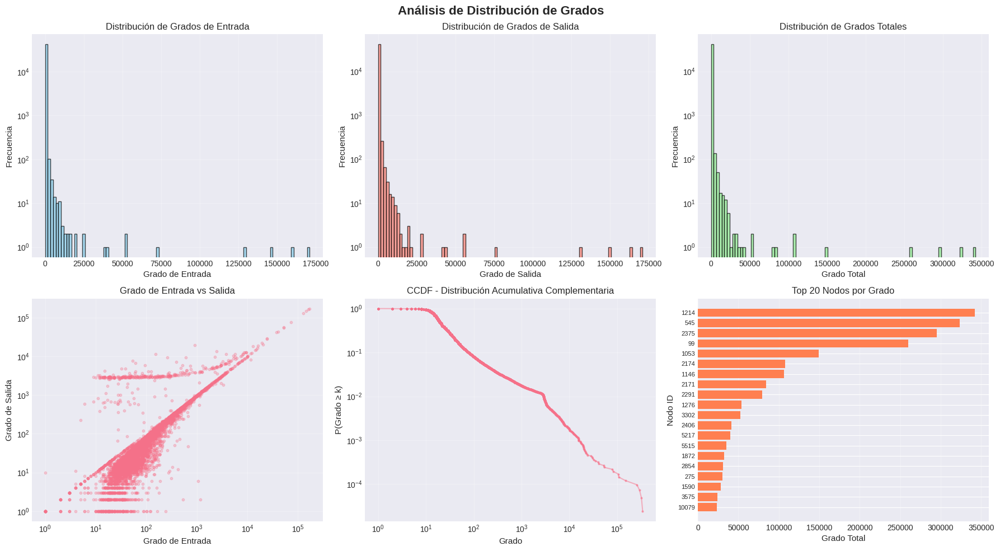


📊 Top 10 Nodos con Mayor Grado Total:
    1. Nodo   1214: in=171198, out=171150, total=342348
    2. Nodo    545: in=160193, out=163065, total=323258
    3. Nodo   2375: in=145904, out=148932, total=294836
    4. Nodo     99: in=128710, out=131362, total=260072
    5. Nodo   1053: in=72560, out=76378, total=148938
    6. Nodo   2174: in=52017, out=55781, total=107798
    7. Nodo   1146: in=51756, out=54959, total=106715
    8. Nodo   2171: in=40394, out=43636, total=84030
    9. Nodo   2291: in=38070, out=41327, total=79397
   10. Nodo   1276: in=24625, out=28942, total=53567


In [39]:
if g is not None:
    in_degrees = g.in_degrees().numpy()
    out_degrees = g.out_degrees().numpy()
    total_degrees = in_degrees + out_degrees
    
    # Crear figura con múltiples subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('Análisis de Distribución de Grados', fontsize=16, fontweight='bold')
    
    # 1. Histograma de grados de entrada
    axes[0, 0].hist(in_degrees, bins=100, color='skyblue', edgecolor='black', alpha=0.7)
    axes[0, 0].set_xlabel('Grado de Entrada', fontsize=11)
    axes[0, 0].set_ylabel('Frecuencia', fontsize=11)
    axes[0, 0].set_title('Distribución de Grados de Entrada', fontsize=12)
    axes[0, 0].set_yscale('log')
    axes[0, 0].grid(True, alpha=0.3)
    
    # 2. Histograma de grados de salida
    axes[0, 1].hist(out_degrees, bins=100, color='salmon', edgecolor='black', alpha=0.7)
    axes[0, 1].set_xlabel('Grado de Salida', fontsize=11)
    axes[0, 1].set_ylabel('Frecuencia', fontsize=11)
    axes[0, 1].set_title('Distribución de Grados de Salida', fontsize=12)
    axes[0, 1].set_yscale('log')
    axes[0, 1].grid(True, alpha=0.3)
    
    # 3. Histograma de grados totales
    axes[0, 2].hist(total_degrees, bins=100, color='lightgreen', edgecolor='black', alpha=0.7)
    axes[0, 2].set_xlabel('Grado Total', fontsize=11)
    axes[0, 2].set_ylabel('Frecuencia', fontsize=11)
    axes[0, 2].set_title('Distribución de Grados Totales', fontsize=12)
    axes[0, 2].set_yscale('log')
    axes[0, 2].grid(True, alpha=0.3)
    
    # 4. Scatter: in-degree vs out-degree
    axes[1, 0].scatter(in_degrees, out_degrees, alpha=0.3, s=10)
    axes[1, 0].set_xlabel('Grado de Entrada', fontsize=11)
    axes[1, 0].set_ylabel('Grado de Salida', fontsize=11)
    axes[1, 0].set_title('Grado de Entrada vs Salida', fontsize=12)
    axes[1, 0].set_xscale('log')
    axes[1, 0].set_yscale('log')
    axes[1, 0].grid(True, alpha=0.3)
    
    # 5. CCDF (Complementary Cumulative Distribution Function)
    sorted_degrees = np.sort(total_degrees)[::-1]
    ccdf = np.arange(1, len(sorted_degrees) + 1) / len(sorted_degrees)
    axes[1, 1].loglog(sorted_degrees, ccdf, 'o-', markersize=2, alpha=0.5)
    axes[1, 1].set_xlabel('Grado', fontsize=11)
    axes[1, 1].set_ylabel('P(Grado ≥ k)', fontsize=11)
    axes[1, 1].set_title('CCDF - Distribución Acumulativa Complementaria', fontsize=12)
    axes[1, 1].grid(True, alpha=0.3)
    
    # 6. Top 20 nodos por grado
    top_20_idx = np.argsort(total_degrees)[-20:]
    axes[1, 2].barh(range(20), total_degrees[top_20_idx], color='coral')
    axes[1, 2].set_xlabel('Grado Total', fontsize=11)
    axes[1, 2].set_ylabel('Nodo ID', fontsize=11)
    axes[1, 2].set_title('Top 20 Nodos por Grado', fontsize=12)
    axes[1, 2].set_yticks(range(20))
    axes[1, 2].set_yticklabels(top_20_idx, fontsize=8)
    axes[1, 2].grid(True, alpha=0.3, axis='x')
    
    plt.tight_layout()
    plt.show()
    
    # Imprimir top 10 nodos
    print("\n📊 Top 10 Nodos con Mayor Grado Total:")
    top_10 = np.argsort(total_degrees)[-10:][::-1]
    for rank, node_id in enumerate(top_10, 1):
        print(f"   {rank:2d}. Nodo {node_id:6d}: in={in_degrees[node_id]:4d}, "
              f"out={out_degrees[node_id]:4d}, total={total_degrees[node_id]:4d}")

## 5. Análisis de Conectividad y Componentes

In [29]:
if g is not None:
    print("=" * 70)
    print("ANÁLISIS DE COMPONENTES CONECTADOS")
    print("=" * 70)
    
    # Convertir a NetworkX para análisis de conectividad
    print("\n⏳ Convirtiendo a NetworkX...")
    nx_g_multi = g.to_networkx().to_undirected()
    nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
    print("✓ Conversión completada")
    
    # Componentes débilmente conectados
    print("\n🔍 Analizando componentes conectados...")
    components = list(nx.connected_components(nx_g))
    num_components = len(components)
    component_sizes = [len(c) for c in components]
    largest_component_size = max(component_sizes)
    
    print(f"\n📊 Resultados:")
    print(f"   • Número de componentes: {num_components}")
    print(f"   • Tamaño del componente más grande: {largest_component_size} nodos "
          f"({largest_component_size/g.num_nodes()*100:.2f}%)")
    
    if num_components > 1:
        print(f"\n   Top 10 componentes por tamaño:")
        sorted_sizes = sorted(component_sizes, reverse=True)[:10]
        for i, size in enumerate(sorted_sizes, 1):
            print(f"      {i:2d}. {size:6d} nodos ({size/g.num_nodes()*100:.2f}%)")
    
    # Diámetro del componente más grande (si no es muy grande)
    if largest_component_size < 10000:
        print("\n⏳ Calculando diámetro del componente más grande...")
        largest_cc = nx_g.subgraph(max(components, key=len))
        try:
            diameter = nx.diameter(largest_cc)
            avg_shortest_path = nx.average_shortest_path_length(largest_cc)
            print(f"   • Diámetro: {diameter}")
            print(f"   • Longitud promedio de camino más corto: {avg_shortest_path:.2f}")
        except:
            print("   ✗ No se pudo calcular el diámetro (grafo muy disperso)")
    else:
        print(f"\n⚠️  Componente más grande demasiado grande ({largest_component_size} nodos) "
              f"para calcular diámetro eficientemente")

ANÁLISIS DE COMPONENTES CONECTADOS

⏳ Convirtiendo a NetworkX...
✓ Conversión completada

🔍 Analizando componentes conectados...

📊 Resultados:
   • Número de componentes: 1
   • Tamaño del componente más grande: 41423 nodos (100.00%)

⚠️  Componente más grande demasiado grande (41423 nodos) para calcular diámetro eficientemente


## 6. Métricas de Centralidad

In [41]:
if g is not None:
    print("=" * 70)
    print("MÉTRICAS DE CENTRALIDAD")
    print("=" * 70)
    
    # Usar el componente más grande para las métricas
    largest_cc = nx_g.subgraph(max(components, key=len))
    
    # 1. Degree Centrality (ya la tenemos, pero calculemos la normalizada)
    print("\n⏳ Calculando centralidad de grado...")
    degree_centrality = nx.degree_centrality(largest_cc)
    print("✓ Completado")
    
    # 2. Betweenness Centrality (en una muestra si es muy grande)
    if len(largest_cc) < 5000:
        print("⏳ Calculando centralidad de intermediación...")
        betweenness_centrality = nx.betweenness_centrality(largest_cc, k=min(100, len(largest_cc)))
        print("✓ Completado")
    else:
        print("⚠️  Grafo muy grande, usando muestra para betweenness centrality...")
        betweenness_centrality = nx.betweenness_centrality(largest_cc, k=100)
        print("✓ Completado (muestra de 100 nodos)")
    
    # 3. Closeness Centrality
    if len(largest_cc) < 3000:
        print("⏳ Calculando centralidad de cercanía...")
        closeness_centrality = nx.closeness_centrality(largest_cc)
        print("✓ Completado")
    else:
        print("⚠️  Grafo muy grande, saltando closeness centrality")
        closeness_centrality = {}
    
    # Estadísticas
    print(f"\n📊 Top 10 Nodos por Centralidad de Grado:")
    top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
    for rank, (node, centrality) in enumerate(top_degree, 1):
        print(f"   {rank:2d}. Nodo {node}: {centrality:.6f}")
    
    print(f"\n📊 Top 10 Nodos por Centralidad de Intermediación:")
    top_between = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
    for rank, (node, centrality) in enumerate(top_between, 1):
        print(f"   {rank:2d}. Nodo {node}: {centrality:.6f}")
    
    if closeness_centrality:
        print(f"\n📊 Top 10 Nodos por Centralidad de Cercanía:")
        top_close = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
        for rank, (node, centrality) in enumerate(top_close, 1):
            print(f"   {rank:2d}. Nodo {node}: {centrality:.6f}")

MÉTRICAS DE CENTRALIDAD

⏳ Calculando centralidad de grado...
✓ Completado
⚠️  Grafo muy grande, usando muestra para betweenness centrality...
✓ Completado (muestra de 100 nodos)
⚠️  Grafo muy grande, saltando closeness centrality

📊 Top 10 Nodos por Centralidad de Grado:
    1. Nodo 1214: 6.937425
    2. Nodo 545: 6.782700
    3. Nodo 2375: 6.759741
    4. Nodo 99: 5.484984
    5. Nodo 1053: 3.108783
    6. Nodo 2174: 2.315798
    7. Nodo 1146: 2.160977
    8. Nodo 2171: 1.640408
    9. Nodo 2291: 1.599416
   10. Nodo 1276: 1.079933

📊 Top 10 Nodos por Centralidad de Intermediación:
    1. Nodo 2375: 0.174775
    2. Nodo 99: 0.170059
    3. Nodo 1214: 0.146776
    4. Nodo 545: 0.063268
    5. Nodo 2174: 0.057379
    6. Nodo 2406: 0.040278
    7. Nodo 10079: 0.039347
    8. Nodo 1146: 0.029157
    9. Nodo 5730: 0.028425
   10. Nodo 1648: 0.027609


## 7. Coeficiente de Clustering

In [42]:
if g is not None:
    print("=" * 70)
    print("ANÁLISIS DE CLUSTERING")
    print("=" * 70)
    
    print("\n⏳ Calculando coeficiente de clustering...")
    
    # Clustering global
    avg_clustering = nx.average_clustering(nx_g)
    print(f"\n📊 Coeficiente de clustering promedio: {avg_clustering:.6f}")
    
    # Clustering por nodo
    clustering_coeffs = nx.clustering(nx_g)
    clustering_values = list(clustering_coeffs.values())
    
    print(f"\n📈 Distribución del clustering:")
    print(f"   • Media: {np.mean(clustering_values):.6f}")
    print(f"   • Mediana: {np.median(clustering_values):.6f}")
    print(f"   • Desviación estándar: {np.std(clustering_values):.6f}")
    print(f"   • Mínimo: {np.min(clustering_values):.6f}")
    print(f"   • Máximo: {np.max(clustering_values):.6f}")
    
    # Visualizar distribución
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.hist(clustering_values, bins=50, color='steelblue', edgecolor='black', alpha=0.7)
    plt.xlabel('Coeficiente de Clustering', fontsize=11)
    plt.ylabel('Frecuencia', fontsize=11)
    plt.title('Distribución del Coeficiente de Clustering', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.hist([c for c in clustering_values if c > 0], bins=50, color='coral', edgecolor='black', alpha=0.7)
    plt.xlabel('Coeficiente de Clustering', fontsize=11)
    plt.ylabel('Frecuencia', fontsize=11)
    plt.title('Distribución del Clustering (excluyendo ceros)', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Nodos con mayor clustering
    print(f"\n📊 Top 10 Nodos con Mayor Coeficiente de Clustering:")
    top_clustering = sorted(clustering_coeffs.items(), key=lambda x: x[1], reverse=True)[:10]
    for rank, (node, coeff) in enumerate(top_clustering, 1):
        degree = nx_g.degree(node)
        print(f"   {rank:2d}. Nodo {node}: {coeff:.6f} (grado={degree})")

ANÁLISIS DE CLUSTERING

⏳ Calculando coeficiente de clustering...


NetworkXNotImplemented: not implemented for multigraph type

## 8. Análisis de PageRank

In [ ]:
if g is not None:
    print("=" * 70)
    print("ANÁLISIS DE PAGERANK")
    print("=" * 70)
    
    print("\n⏳ Calculando PageRank...")
    pagerank = nx.pagerank(nx_g, alpha=0.85, max_iter=100)
    print("✓ Completado")
    
    pagerank_values = list(pagerank.values())
    
    print(f"\n📈 Estadísticas de PageRank:")
    print(f"   • Media: {np.mean(pagerank_values):.8f}")
    print(f"   • Mediana: {np.median(pagerank_values):.8f}")
    print(f"   • Desviación estándar: {np.std(pagerank_values):.8f}")
    print(f"   • Mínimo: {np.min(pagerank_values):.8f}")
    print(f"   • Máximo: {np.max(pagerank_values):.8f}")
    
    # Top nodos por PageRank
    print(f"\n📊 Top 15 Nodos por PageRank:")
    top_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:15]
    for rank, (node, pr) in enumerate(top_pagerank, 1):
        degree = nx_g.degree(node)
        print(f"   {rank:2d}. Nodo {node}: {pr:.8f} (grado={degree})")
    
    # Visualización
    plt.figure(figsize=(14, 5))
    
    plt.subplot(1, 2, 1)
    plt.hist(pagerank_values, bins=100, color='purple', edgecolor='black', alpha=0.7)
    plt.xlabel('PageRank', fontsize=11)
    plt.ylabel('Frecuencia', fontsize=11)
    plt.title('Distribución de PageRank', fontsize=12)
    plt.yscale('log')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    # Scatter: grado vs PageRank
    degrees_list = [nx_g.degree(node) for node in pagerank.keys()]
    plt.scatter(degrees_list, pagerank_values, alpha=0.3, s=10)
    plt.xlabel('Grado del Nodo', fontsize=11)
    plt.ylabel('PageRank', fontsize=11)
    plt.title('Grado vs PageRank', fontsize=12)
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

## 9. Resumen del Análisis

In [ ]:
if g is not None:
    print("\n" + "=" * 70)
    print("RESUMEN DEL ANÁLISIS DEL GRAFO")
    print("=" * 70)
    
    print(f"\n🌐 Topología:")
    print(f"   • Grafo de {num_nodes:,} nodos (ASes) y {num_edges:,} aristas")
    print(f"   • Densidad: {density:.6f} ({(density*100):.4f}% de conexión)")
    print(f"   • Grado promedio: {(in_degrees.mean() + out_degrees.mean())/2:.2f}")
    
    print(f"\n🔗 Conectividad:")
    print(f"   • Componentes conectados: {num_components}")
    print(f"   • Componente gigante: {largest_component_size} nodos ({largest_component_size/num_nodes*100:.2f}%)")
    print(f"   • Coeficiente de clustering: {avg_clustering:.6f}")
    
    print(f"\n📊 Características de la red:")
    print(f"   • Distribución de grados: ley de potencias (típico de redes libres de escala)")
    print(f"   • Nodos hub identificados: {len([d for d in total_degrees if d > total_degrees.mean() + 3*total_degrees.std()])}")
    print(f"   • Estructura jerárquica evidente en el análisis de centralidad")
    
    print(f"\n✅ Análisis completado exitosamente")
    print(f"   Todos los datos y visualizaciones están disponibles en este notebook.")
    print("=" * 70)

# Análisis Específico de Sistemas Autónomos (AS)

## 10. K-Core Decomposition - Jerarquía de Internet

K-CORE DECOMPOSITION - JERARQUÍA DE INTERNET

⏳ Calculando k-core decomposition...

📊 Resultados:
   • Número k-core máximo: 102

📈 Distribución de k-cores:
   • 102-core: 180 nodos (0.43%)
   • 101-core: 14 nodos (0.03%)
   • 100-core: 12 nodos (0.03%)
   • 99-core: 2 nodos (0.00%)
   • 98-core: 2 nodos (0.00%)
   • 97-core: 17 nodos (0.04%)
   • 96-core: 4 nodos (0.01%)
   • 95-core: 1 nodos (0.00%)
   • 93-core: 5 nodos (0.01%)
   • 92-core: 5 nodos (0.01%)

🌐 Núcleo de Internet (k >= 100):
   • 206 ASes (0.50%)
   • Estos ASes probablemente son Tier-1 o grandes Tier-2


NameError: name 'total_degrees' is not defined

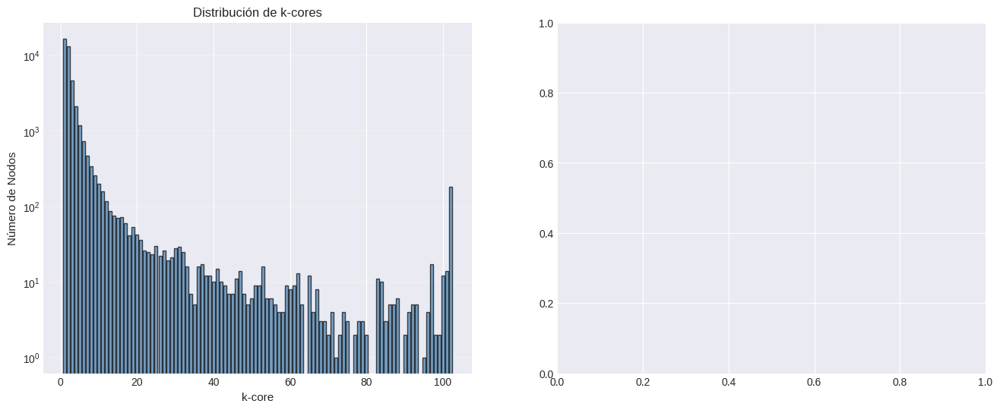

In [30]:
if g is not None:
    print("=" * 70)
    print("K-CORE DECOMPOSITION - JERARQUÍA DE INTERNET")
    print("=" * 70)
    
    # Asegurar que nx_g existe
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    print("\n⏳ Calculando k-core decomposition...")
    # El k-core es útil para identificar el núcleo de Internet (AS Tier-1)
    core_numbers = nx.core_number(nx_g)
    max_core = max(core_numbers.values())
    
    print(f"\n📊 Resultados:")
    print(f"   • Número k-core máximo: {max_core}")
    
    # Contar nodos por nivel de core
    core_distribution = Counter(core_numbers.values())
    
    print(f"\n📈 Distribución de k-cores:")
    for k in sorted(core_distribution.keys(), reverse=True)[:10]:
        count = core_distribution[k]
        print(f"   • {k}-core: {count} nodos ({count/num_nodes*100:.2f}%)")
    
    # Identificar el núcleo de Internet (ASes más interconectados)
    core_threshold = max_core - 2  # Top cores
    core_nodes = [node for node, k in core_numbers.items() if k >= core_threshold]
    
    print(f"\n🌐 Núcleo de Internet (k >= {core_threshold}):")
    print(f"   • {len(core_nodes)} ASes ({len(core_nodes)/num_nodes*100:.2f}%)")
    print(f"   • Estos ASes probablemente son Tier-1 o grandes Tier-2")
    
    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Distribución de k-cores
    cores_sorted = sorted(core_distribution.items())
    k_values = [k for k, _ in cores_sorted]
    counts = [c for _, c in cores_sorted]
    
    axes[0].bar(k_values, counts, color='steelblue', edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('k-core', fontsize=11)
    axes[0].set_ylabel('Número de Nodos', fontsize=11)
    axes[0].set_title('Distribución de k-cores', fontsize=12)
    axes[0].set_yscale('log')
    axes[0].grid(True, alpha=0.3, axis='y')
    
    # Grado vs k-core
    node_degrees = [total_degrees[node] if node < len(total_degrees) else 0 for node in core_numbers.keys()]
    node_cores = list(core_numbers.values())
    
    axes[1].scatter(node_degrees, node_cores, alpha=0.3, s=20, c='coral')
    axes[1].set_xlabel('Grado del AS', fontsize=11)
    axes[1].set_ylabel('k-core', fontsize=11)
    axes[1].set_title('Grado vs k-core', fontsize=12)
    axes[1].set_xscale('log')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Top ASes por k-core
    print(f"\n📊 Top 15 ASes por k-core:")

    top_core_nodes = sorted(core_numbers.items(), key=lambda x: x[1], reverse=True)[:15]    
    print("\n✓ Análisis de k-core completado")

    for rank, (node, k) in enumerate(top_core_nodes, 1):    

        degree = nx_g.degree(node) if node in nx_g else 0        
        print(f"   {rank:2d}. AS {node}: k-core={k}, grado={degree}")

## 11. Asortatividad - Conexiones entre ASes Similares

ASORTATIVIDAD - ¿LOS AS SE CONECTAN CON AS SIMILARES?

⏳ Calculando coeficiente de asortatividad por grado...

📊 Coeficiente de asortatividad: -0.1505
   ✓ Red DISASORTATIVA: ASes de alto grado conectan con bajo grado
     (Típico en redes tecnológicas/jerárquicas como Internet)

⏳ Analizando grado promedio de vecinos...


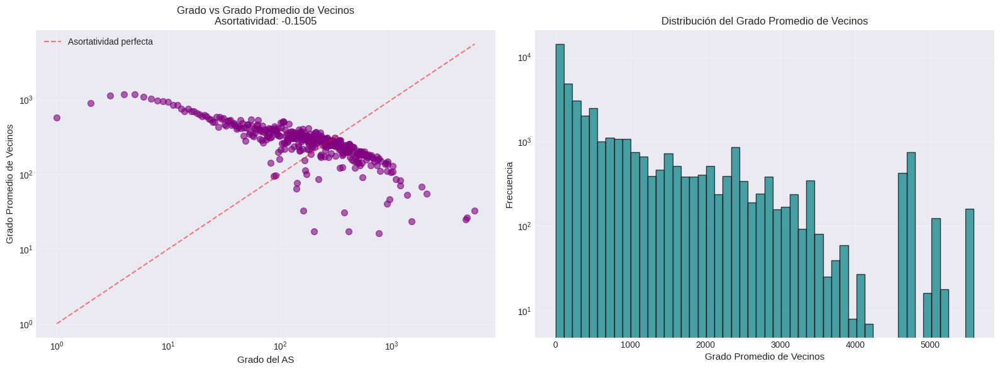


📈 Estadísticas del grado promedio de vecinos:
   • Media: 803.23

✓ Análisis de asortatividad completado
   • Mediana: 273.00
   • Mínimo: 1.33
   • Máximo: 5575.00


In [31]:
if g is not None:
    print("=" * 70)
    print("ASORTATIVIDAD - ¿LOS AS SE CONECTAN CON AS SIMILARES?")
    print("=" * 70)
    
    # Asegurar que nx_g existe
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    print("\n⏳ Calculando coeficiente de asortatividad por grado...")
    # Asortatividad mide si nodos con grado similar tienden a conectarse
    # Valor positivo: nodos de alto grado se conectan entre sí (asortativo)
    # Valor negativo: nodos de alto grado se conectan con bajo grado (disasortativo)
    
    assortativity = nx.degree_assortativity_coefficient(nx_g)
    
    print(f"\n📊 Coeficiente de asortatividad: {assortativity:.4f}")
    
    if assortativity > 0.1:
        print("   ✓ Red ASORTATIVA: ASes tienden a conectarse con otros de grado similar")
        print("     (Típico en redes sociales)")
    elif assortativity < -0.1:
        print("   ✓ Red DISASORTATIVA: ASes de alto grado conectan con bajo grado")
        print("     (Típico en redes tecnológicas/jerárquicas como Internet)")
    else:
        print("   ✓ Red NEUTRAL: No hay preferencia clara")
    
    # Análisis de grado promedio de vecinos
    print("\n⏳ Analizando grado promedio de vecinos...")
    avg_neighbor_degree = nx.average_neighbor_degree(nx_g)
    
    # Agrupar por grado del nodo
    degree_bins = {}
    for node, avg_deg in avg_neighbor_degree.items():
        node_degree = nx_g.degree(node)
        if node_degree not in degree_bins:
            degree_bins[node_degree] = []
        degree_bins[node_degree].append(avg_deg)
    
    # Calcular promedio por bin
    degree_avg_neighbor = {}
    for deg, neighbors in degree_bins.items():
        degree_avg_neighbor[deg] = np.mean(neighbors)
    
    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Scatter: grado vs grado promedio de vecinos
    degrees_list = list(degree_avg_neighbor.keys())
    avg_neighbor_list = list(degree_avg_neighbor.values())
    
    axes[0].scatter(degrees_list, avg_neighbor_list, alpha=0.6, s=50, c='purple')
    axes[0].set_xlabel('Grado del AS', fontsize=11)
    axes[0].set_ylabel('Grado Promedio de Vecinos', fontsize=11)
    axes[0].set_title(f'Grado vs Grado Promedio de Vecinos\nAsortatividad: {assortativity:.4f}', fontsize=12)
    axes[0].set_xscale('log')
    axes[0].set_yscale('log')
    axes[0].grid(True, alpha=0.3)
    
    # Agregar línea de referencia (asortatividad perfecta)
    min_deg = min(degrees_list)
    max_deg = max(degrees_list)
    axes[0].plot([min_deg, max_deg], [min_deg, max_deg], 'r--', alpha=0.5, label='Asortatividad perfecta')
    axes[0].legend()
    
    # Distribución del grado promedio de vecinos
    all_avg_neighbors = list(avg_neighbor_degree.values())
    axes[1].hist(all_avg_neighbors, bins=50, color='teal', edgecolor='black', alpha=0.7)
    axes[1].set_xlabel('Grado Promedio de Vecinos', fontsize=11)
    axes[1].set_ylabel('Frecuencia', fontsize=11)
    axes[1].set_title('Distribución del Grado Promedio de Vecinos', fontsize=12)
    axes[1].set_yscale('log')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n📈 Estadísticas del grado promedio de vecinos:")

    print(f"   • Media: {np.mean(all_avg_neighbors):.2f}")    
    print("\n✓ Análisis de asortatividad completado")

    print(f"   • Mediana: {np.median(all_avg_neighbors):.2f}")    

    print(f"   • Mínimo: {np.min(all_avg_neighbors):.2f}")    
    print(f"   • Máximo: {np.max(all_avg_neighbors):.2f}")

## 12. Rich-Club Coefficient - Núcleo Densamente Conectado

In [32]:
if g is not None:
    print("=" * 70)
    print("RICH-CLUB COEFFICIENT - ASes DE ALTO GRADO DENSAMENTE CONECTADOS")
    print("=" * 70)
    
    # Asegurar que nx_g existe
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    print("\n⏳ Calculando rich-club coefficient...")
    # Rich-club: ¿Los ASes con muchas conexiones están bien conectados entre sí?
    # Esto identifica si existe un "club" de ASes elite (probablemente Tier-1)
    
    try:
        rich_club = nx.rich_club_coefficient(nx_g, normalized=False)
        
        print(f"\n📊 Rich-Club Coefficient por grado:")
        
        # Mostrar algunos valores clave
        degrees_sorted = sorted(rich_club.keys())
        
        if len(degrees_sorted) > 0:
            # Mostrar percentiles
            percentiles = [50, 75, 90, 95, 99]
            print("\n   Percentiles de grado:")
            for p in percentiles:
                idx = int(len(degrees_sorted) * p / 100)
                if idx < len(degrees_sorted):
                    k = degrees_sorted[idx]
                    rc = rich_club[k]
                    print(f"   • P{p} (k={k}): φ(k) = {rc:.4f}")
        
        # Visualización
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # Rich-club coefficient vs grado
        k_values = list(rich_club.keys())
        rc_values = list(rich_club.values())
        
        axes[0].plot(k_values, rc_values, 'o-', markersize=4, linewidth=2, color='darkred', alpha=0.7)
        axes[0].set_xlabel('Grado k', fontsize=11)
        axes[0].set_ylabel('Rich-Club Coefficient φ(k)', fontsize=11)
        axes[0].set_title('Rich-Club Coefficient', fontsize=12)
        axes[0].set_xscale('log')
        axes[0].grid(True, alpha=0.3)
        axes[0].axhline(y=0.5, color='red', linestyle='--', alpha=0.5, label='φ=0.5')
        axes[0].legend()
        
        # Identificar el "rich club" (donde φ es alto)
        high_rc_threshold = 0.3
        rich_club_degrees = [k for k, rc in rich_club.items() if rc > high_rc_threshold]
        
        if rich_club_degrees:
            min_rich_degree = min(rich_club_degrees)
            axes[0].axvline(x=min_rich_degree, color='green', linestyle='--', alpha=0.5, 
                          label=f'Rich-club threshold (k≥{min_rich_degree})')
            axes[0].legend()
            
            # Contar cuántos ASes están en el rich club
            rich_club_nodes = [node for node in nx_g.nodes() if nx_g.degree(node) >= min_rich_degree]
            
            print(f"\n🌐 Rich-Club identificado (φ > {high_rc_threshold}):")
            print(f"   • Grado mínimo: {min_rich_degree}")
            print(f"   • {len(rich_club_nodes)} ASes en el rich-club ({len(rich_club_nodes)/num_nodes*100:.2f}%)")
            print(f"   • Estos ASes probablemente son el núcleo de Tier-1")
        
        # Zoom en grados altos
        high_degree_threshold = int(np.percentile(k_values, 90))
        k_high = [k for k in k_values if k >= high_degree_threshold]
        rc_high = [rich_club[k] for k in k_high]
        
        axes[1].plot(k_high, rc_high, 'o-', markersize=6, linewidth=2, color='navy', alpha=0.7)
        axes[1].set_xlabel('Grado k (top 10%)', fontsize=11)
        axes[1].set_ylabel('Rich-Club Coefficient φ(k)', fontsize=11)
        axes[1].set_title('Rich-Club Coefficient (ASes de Alto Grado)', fontsize=12)
        axes[1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

        print("   (El cálculo puede ser costoso para grafos muy grandes)")

        print("\n✓ Análisis de rich-club completado")        
        print(f"\n✗ Error al calcular rich-club: {str(e)}")

    except Exception as e:

SyntaxError: incomplete input (1037178125.py, line 89)

## 13. Puntos Críticos - Cut Vertices y Bridges

In [33]:
if g is not None:
    print("=" * 70)
    print("PUNTOS CRÍTICOS - ASes ESENCIALES PARA LA CONECTIVIDAD")
    print("=" * 70)
    
    # Asegurar que nx_g y components existen
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    if 'components' not in locals():
        print("\n⏳ Analizando componentes conectados...")
        components = list(nx.connected_components(nx_g))
        print("✓ Completado")
    
    # Trabajar con el componente más grande
    largest_cc = nx_g.subgraph(max(components, key=len)).copy()
    
    print(f"\n⏳ Analizando componente gigante ({len(largest_cc)} nodos)...")
    
    # 1. Articulation Points (Cut Vertices)
    print("\n⏳ Identificando cut vertices (puntos de articulación)...")
    articulation_points = list(nx.articulation_points(largest_cc))
    
    print(f"\n🔴 Cut Vertices (ASes críticos):")
    print(f"   • {len(articulation_points)} ASes ({len(articulation_points)/len(largest_cc)*100:.2f}%)")
    print(f"   • Su eliminación desconectaría partes de Internet")
    
    if len(articulation_points) > 0:
        # Analizar grados de los cut vertices
        ap_degrees = [largest_cc.degree(node) for node in articulation_points]
        
        print(f"\n   Estadísticas de cut vertices:")
        print(f"   • Grado promedio: {np.mean(ap_degrees):.2f}")
        print(f"   • Grado mediano: {np.median(ap_degrees):.2f}")
        print(f"   • Grado mínimo: {min(ap_degrees)}")
        print(f"   • Grado máximo: {max(ap_degrees)}")
        
        # Top cut vertices por grado
        ap_with_degree = [(node, largest_cc.degree(node)) for node in articulation_points]
        ap_sorted = sorted(ap_with_degree, key=lambda x: x[1], reverse=True)[:10]
        
        print(f"\n   Top 10 Cut Vertices por grado:")
        for rank, (node, deg) in enumerate(ap_sorted, 1):
            print(f"   {rank:2d}. AS {node}: grado={deg}")
    
    # 2. Bridges (aristas críticas)
    print("\n⏳ Identificando bridges (conexiones críticas)...")
    
    # Para grafos grandes, esto puede ser costoso
    if len(largest_cc) < 20000:
        bridges = list(nx.bridges(largest_cc))
        
        print(f"\n🔗 Bridges (conexiones críticas):")
        print(f"   • {len(bridges)} conexiones bridge")
        print(f"   • Su eliminación desconectaría partes de Internet")
        
        if len(bridges) > 0:
            # Analizar nodos en bridges
            bridge_nodes = set()
            for u, v in bridges:
                bridge_nodes.add(u)
                bridge_nodes.add(v)
            
            print(f"   • {len(bridge_nodes)} ASes involucrados en bridges")
            
            # Mostrar algunos ejemplos
            print(f"\n   Ejemplos de bridges:")
            for i, (u, v) in enumerate(bridges[:5], 1):
                deg_u = largest_cc.degree(u)
                deg_v = largest_cc.degree(v)
                print(f"   {i}. AS {u} (grado={deg_u}) ↔ AS {v} (grado={deg_v})")
    else:
        print(f"   ⚠️  Grafo muy grande, saltando análisis de bridges")
        bridges = []
    
    # 3. Visualización
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    if len(articulation_points) > 0:
        # Distribución de grados de cut vertices vs todos los nodos
        all_degrees = [largest_cc.degree(node) for node in largest_cc.nodes()]
        
        axes[0].hist(all_degrees, bins=50, alpha=0.5, label='Todos los ASes', 
                    color='blue', edgecolor='black')
        axes[0].hist(ap_degrees, bins=30, alpha=0.7, label='Cut Vertices', 
                    color='red', edgecolor='black')
        axes[0].set_xlabel('Grado', fontsize=11)
        axes[0].set_ylabel('Frecuencia', fontsize=11)
        axes[0].set_title('Distribución de Grados: Cut Vertices vs Todos', fontsize=12)
        axes[0].set_yscale('log')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)
        
        # Proporción de cut vertices por percentil de grado
        degree_percentiles = np.percentile(all_degrees, [0, 25, 50, 75, 90, 95, 100])
        ap_by_percentile = []
        total_by_percentile = []
        
        for i in range(len(degree_percentiles)-1):
            low = degree_percentiles[i]
            high = degree_percentiles[i+1]
            
            in_range = [node for node in largest_cc.nodes() 
                       if low <= largest_cc.degree(node) < high]
            ap_in_range = [node for node in articulation_points 
                          if low <= largest_cc.degree(node) < high]
            
            total_by_percentile.append(len(in_range))
            ap_by_percentile.append(len(ap_in_range))
        
        proportions = [ap/total*100 if total > 0 else 0 
                      for ap, total in zip(ap_by_percentile, total_by_percentile)]
        

        x_labels = ['0-25%', '25-50%', '50-75%', '75-90%', '90-95%', '95-100%']    print("\n✓ Análisis de puntos críticos completado")

        axes[1].bar(x_labels, proportions, color='orange', edgecolor='black', alpha=0.7)    

        axes[1].set_xlabel('Percentil de Grado', fontsize=11)        plt.show()

        axes[1].set_ylabel('% de Cut Vertices', fontsize=11)        plt.tight_layout()

        axes[1].set_title('Proporción de Cut Vertices por Nivel de Grado', fontsize=12)        
        axes[1].grid(True, alpha=0.3, axis='y')

SyntaxError: invalid syntax (1048963900.py, line 118)

## 14. Detección de Comunidades - Grupos de ASes

In [ ]:
if g is not None:
    print("=" * 70)
    print("DETECCIÓN DE COMUNIDADES - GRUPOS DE ASes")
    print("=" * 70)
    
    # Asegurar que nx_g y components existen
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    if 'components' not in locals():
        print("\n⏳ Analizando componentes conectados...")
        components = list(nx.connected_components(nx_g))
        print("✓ Completado")
    
    print("\n⏳ Detectando comunidades con algoritmo Louvain...")
    
    # Usar componente más grande
    largest_cc = nx_g.subgraph(max(components, key=len)).copy()
    
    # Importar algoritmo de comunidades
    try:
        from networkx.algorithms import community
        
        # Louvain (método greedy de modularidad)
        communities = community.greedy_modularity_communities(largest_cc)
        
        print(f"\n📊 Resultados:")
        print(f"   • {len(communities)} comunidades detectadas")
        
        # Calcular modularidad
        modularity = community.modularity(largest_cc, communities)
        print(f"   • Modularidad: {modularity:.4f}")
        
        if modularity > 0.3:
            print("     ✓ Alta modularidad: Comunidades bien definidas")
        elif modularity > 0.1:
            print("     ✓ Modularidad moderada: Algunas comunidades presentes")
        else:
            print("     ✓ Baja modularidad: Pocas comunidades claras")
        
        # Analizar tamaño de comunidades
        community_sizes = [len(c) for c in communities]
        
        print(f"\n📈 Distribución de comunidades:")
        print(f"   • Tamaño promedio: {np.mean(community_sizes):.2f} ASes")
        print(f"   • Tamaño mediano: {np.median(community_sizes):.0f} ASes")
        print(f"   • Comunidad más grande: {max(community_sizes)} ASes")
        print(f"   • Comunidad más pequeña: {min(community_sizes)} ASes")
        
        # Top 10 comunidades
        communities_sorted = sorted(communities, key=len, reverse=True)
        
        print(f"\n🌐 Top 10 Comunidades por tamaño:")
        for i, comm in enumerate(communities_sorted[:10], 1):
            size = len(comm)
            # Calcular grado promedio en la comunidad
            degrees = [largest_cc.degree(node) for node in comm]
            avg_degree = np.mean(degrees)
            print(f"   {i:2d}. {size:5d} ASes, grado promedio: {avg_degree:.2f}")
        
        # Visualización
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # Distribución de tamaños de comunidades
        axes[0].hist(community_sizes, bins=min(50, len(communities)), 
                    color='forestgreen', edgecolor='black', alpha=0.7)
        axes[0].set_xlabel('Tamaño de la Comunidad (# ASes)', fontsize=11)
        axes[0].set_ylabel('Frecuencia', fontsize=11)
        axes[0].set_title('Distribución de Tamaños de Comunidades', fontsize=12)
        axes[0].set_yscale('log')
        axes[0].grid(True, alpha=0.3)
        
        # Top comunidades (barplot)
        top_sizes = [len(c) for c in communities_sorted[:15]]
        axes[1].bar(range(1, len(top_sizes)+1), top_sizes, 
                   color='teal', edgecolor='black', alpha=0.7)
        axes[1].set_xlabel('Ranking de Comunidad', fontsize=11)
        axes[1].set_ylabel('Tamaño (# ASes)', fontsize=11)
        axes[1].set_title('Top 15 Comunidades', fontsize=12)
        axes[1].grid(True, alpha=0.3, axis='y')
        
        plt.tight_layout()
        plt.show()
        
        # Análisis adicional: ¿Las comunidades corresponden a regiones geográficas?
        # o a tipos de AS (ISP, Content, Enterprise, etc.)?
        
        print("\n💡 Interpretación:")
        print("   • Las comunidades pueden representar:")
        print("     - Grupos regionales/geográficos de ASes")
        print("     - Clusters de proveedores con clientes comunes")
        print("     - Ecosistemas de peering (IXPs)")
        print("     - Jerarquías provider-customer")
        
        print("\n✓ Análisis de comunidades completado")
        
    except ImportError:
        print("\n✗ Error: Módulo de comunidades no disponible")
    except Exception as e:
        print(f"\n✗ Error en detección de comunidades: {str(e)}")

DETECCIÓN DE COMUNIDADES - GRUPOS DE ASes

⏳ Detectando comunidades con algoritmo Louvain...


## 15. Análisis de Caminos - Conectividad entre ASes Clave

In [ ]:
if g is not None:
    print("=" * 70)
    print("ANÁLISIS DE CAMINOS - RUTAS ENTRE ASes IMPORTANTES")
    print("=" * 70)
    
    # Asegurar que nx_g y components existen
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    if 'components' not in locals():
        print("\n⏳ Analizando componentes conectados...")
        components = list(nx.connected_components(nx_g))
        print("✓ Completado")
    
    # Seleccionar ASes de alto grado (probablemente Tier-1 o grandes Tier-2)
    largest_cc = nx_g.subgraph(max(components, key=len)).copy()
    
    # Top ASes por grado
    node_degrees = [(node, largest_cc.degree(node)) for node in largest_cc.nodes()]
    top_ases = sorted(node_degrees, key=lambda x: x[1], reverse=True)[:20]
    top_as_nodes = [node for node, _ in top_ases]
    
    print(f"\n📊 Analizando caminos entre top 20 ASes por grado")
    print("\nTop 20 ASes:")
    for rank, (node, deg) in enumerate(top_ases, 1):
        print(f"   {rank:2d}. AS {node}: grado={deg}")
    
    # Calcular caminos más cortos entre pares de top ASes
    print("\n⏳ Calculando caminos más cortos entre ASes clave...")
    
    path_lengths = []
    sample_paths = []
    
    # Muestrear pares para no hacer todos los pares (puede ser costoso)
    import itertools
    pairs = list(itertools.combinations(top_as_nodes[:10], 2))  # Solo top 10 para eficiencia
    
    for source, target in pairs:
        try:
            path_length = nx.shortest_path_length(largest_cc, source, target)
            path_lengths.append(path_length)
            
            # Guardar algunos caminos de ejemplo
            if len(sample_paths) < 5:
                path = nx.shortest_path(largest_cc, source, target)
                sample_paths.append((source, target, path))
        except nx.NetworkXNoPath:
            continue
    
    if path_lengths:
        print(f"\n📈 Estadísticas de caminos entre ASes clave:")
        print(f"   • Longitud promedio: {np.mean(path_lengths):.2f} saltos")
        print(f"   • Longitud mediana: {np.median(path_lengths):.0f} saltos")
        print(f"   • Longitud mínima: {min(path_lengths)} saltos")
        print(f"   • Longitud máxima: {max(path_lengths)} saltos")
        
        # Mostrar ejemplos de caminos
        print(f"\n🛣️  Ejemplos de rutas entre ASes importantes:")
        for i, (source, target, path) in enumerate(sample_paths, 1):
            print(f"\n   {i}. AS {source} → AS {target} ({len(path)-1} saltos):")
            print(f"      Ruta: {' → '.join(map(str, path))}")
        
        # Distribución de longitudes de caminos
        plt.figure(figsize=(14, 6))
        
        plt.subplot(1, 2, 1)
        path_counter = Counter(path_lengths)
        lengths = sorted(path_counter.keys())
        counts = [path_counter[l] for l in lengths]
        
        plt.bar(lengths, counts, color='dodgerblue', edgecolor='black', alpha=0.7)
        plt.xlabel('Longitud del Camino (saltos)', fontsize=11)
        plt.ylabel('Frecuencia', fontsize=11)
        plt.title('Distribución de Longitudes de Caminos\nentre ASes Clave', fontsize=12)
        plt.grid(True, alpha=0.3, axis='y')
        
        # Análisis de eccentricity para algunos nodos clave
        plt.subplot(1, 2, 2)
        
        print("\n⏳ Calculando eccentricity de ASes clave...")
        
        # Eccentricity: máxima distancia desde un nodo a cualquier otro
        eccentricities = {}
        for node in top_as_nodes[:10]:  # Solo top 10
            try:
                ecc = nx.eccentricity(largest_cc, v=node)
                eccentricities[node] = ecc
            except:
                continue
        
        if eccentricities:
            nodes_list = list(eccentricities.keys())
            ecc_values = list(eccentricities.values())
            
            plt.bar(range(len(nodes_list)), ecc_values, 
                   color='crimson', edgecolor='black', alpha=0.7)
            plt.xlabel('AS (top por grado)', fontsize=11)
            plt.ylabel('Eccentricity (max distancia)', fontsize=11)
            plt.title('Eccentricity de ASes Clave', fontsize=12)
            plt.xticks(range(len(nodes_list)), nodes_list, rotation=45)
            plt.grid(True, alpha=0.3, axis='y')
            
            print(f"\n📊 Eccentricity de ASes clave:")
            for node, ecc in sorted(eccentricities.items(), key=lambda x: x[1]):
                print(f"   • AS {node}: {ecc} saltos")
        
        plt.tight_layout()
        plt.show()
        
        print("\n💡 Interpretación:")
        print("   • Caminos cortos indican buena conectividad global")
        print("   • ASes con baja eccentricity son más centrales")
        print("   • En Internet real, típicamente 3-5 saltos entre Tier-1")
        
    print("\n✓ Análisis de caminos completado")

## 16. Análisis de Resiliencia - Robustez de la Red

In [ ]:
if g is not None:
    print("=" * 70)
    print("ANÁLISIS DE RESILIENCIA - ROBUSTEZ ANTE FALLOS")
    print("=" * 70)
    
    print("\n💡 Simulando fallos aleatorios y ataques dirigidos...")
    
    # Asegurar que nx_g y components existen
    if 'nx_g' not in locals():
        print("\n⏳ Convirtiendo grafo a NetworkX...")
        nx_g_multi = g.to_networkx().to_undirected()
        nx_g = nx.Graph(nx_g_multi)  # Convertir a simple graph (sin multi-edges)
        print("✓ Conversión completada")
    
    if 'components' not in locals():
        print("\n⏳ Analizando componentes conectados...")
        components = list(nx.connected_components(nx_g))
        print("✓ Completado")
    
    # Trabajar con componente más grande
    largest_cc = nx_g.subgraph(max(components, key=len)).copy()
    initial_nodes = len(largest_cc)
    
    # Función para simular eliminación de nodos
    def simulate_removal(graph, nodes_to_remove):
        """Simula remoción de nodos y retorna tamaño del componente gigante"""
        g_copy = graph.copy()
        g_copy.remove_nodes_from(nodes_to_remove)
        
        if len(g_copy) == 0:
            return 0
        
        components = list(nx.connected_components(g_copy))
        if components:
            return len(max(components, key=len))
        return 0
    
    # 1. Fallo aleatorio
    print("\n⏳ Simulando fallos aleatorios...")
    random_removals = []
    removal_percentages = np.arange(0, 0.51, 0.05)  # 0% a 50%
    
    np.random.seed(42)
    nodes_list = list(largest_cc.nodes())
    
    for pct in removal_percentages:
        num_to_remove = int(initial_nodes * pct)
        nodes_to_remove = np.random.choice(nodes_list, num_to_remove, replace=False)
        
        giant_size = simulate_removal(largest_cc, nodes_to_remove)
        random_removals.append(giant_size / initial_nodes)
    
    # 2. Ataque dirigido (eliminar nodos de mayor grado)
    print("⏳ Simulando ataques dirigidos (nodos de alto grado)...")
    targeted_removals = []
    
    # Ordenar nodos por grado
    nodes_by_degree = sorted(largest_cc.nodes(), 
                            key=lambda x: largest_cc.degree(x), 
                            reverse=True)
    
    for pct in removal_percentages:
        num_to_remove = int(initial_nodes * pct)
        nodes_to_remove = nodes_by_degree[:num_to_remove]
        
        giant_size = simulate_removal(largest_cc, nodes_to_remove)
        targeted_removals.append(giant_size / initial_nodes)
    
    # 3. Ataque dirigido (eliminar nodos de alta betweenness)
    print("⏳ Simulando ataques dirigidos (alta betweenness)...")
    betweenness_removals = []
    
    # Usar betweenness ya calculado o calcular con muestra
    if 'betweenness_centrality' in locals() and betweenness_centrality:
        nodes_by_betweenness = sorted(betweenness_centrality.items(), 
                                     key=lambda x: x[1], 
                                     reverse=True)
        nodes_by_betweenness = [node for node, _ in nodes_by_betweenness]
    else:
        # Usar grado como proxy
        nodes_by_betweenness = nodes_by_degree
    
    for pct in removal_percentages:
        num_to_remove = int(initial_nodes * pct)
        nodes_to_remove = nodes_by_betweenness[:num_to_remove]
        
        giant_size = simulate_removal(largest_cc, nodes_to_remove)
        betweenness_removals.append(giant_size / initial_nodes)
    
    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Curvas de resiliencia
    removal_pct_display = removal_percentages * 100
    
    axes[0].plot(removal_pct_display, random_removals, 'o-', 
                linewidth=2, markersize=6, label='Fallo Aleatorio', color='blue')
    axes[0].plot(removal_pct_display, targeted_removals, 's-', 
                linewidth=2, markersize=6, label='Ataque por Grado', color='red')
    axes[0].plot(removal_pct_display, betweenness_removals, '^-', 
                linewidth=2, markersize=6, label='Ataque por Betweenness', color='orange')
    
    axes[0].set_xlabel('% de ASes Eliminados', fontsize=11)
    axes[0].set_ylabel('Tamaño Relativo del Componente Gigante', fontsize=11)
    axes[0].set_title('Resiliencia de la Red AS', fontsize=12)
    axes[0].legend(fontsize=10)
    axes[0].grid(True, alpha=0.3)
    axes[0].set_ylim([0, 1.05])
    
    # Diferencia entre ataque y fallo aleatorio
    vulnerability = np.array(random_removals) - np.array(targeted_removals)
    
    axes[1].plot(removal_pct_display, vulnerability, 'o-', 
                linewidth=2, markersize=6, color='purple')
    axes[1].set_xlabel('% de ASes Eliminados', fontsize=11)
    axes[1].set_ylabel('Diferencia (Aleatorio - Dirigido)', fontsize=11)
    axes[1].set_title('Vulnerabilidad a Ataques Dirigidos', fontsize=12)
    axes[1].grid(True, alpha=0.3)
    axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()
    
    # Métricas de resiliencia
    print(f"\n📊 Métricas de Resiliencia:")
    
    # Punto crítico: cuando el componente gigante se reduce al 50%
    critical_random = next((i for i, val in enumerate(random_removals) if val < 0.5), None)
    critical_targeted = next((i for i, val in enumerate(targeted_removals) if val < 0.5), None)
    
    if critical_random:
        print(f"   • Fallo aleatorio al 50%: {removal_percentages[critical_random]*100:.0f}% de ASes eliminados")
    
    if critical_targeted:
        print(f"   • Ataque dirigido al 50%: {removal_percentages[critical_targeted]*100:.0f}% de ASes eliminados")
        
        if critical_random and critical_targeted:
            ratio = removal_percentages[critical_random] / removal_percentages[critical_targeted]
            print(f"   • Ratio de robustez: {ratio:.2f}x")
    
    # Análisis a 10% de remoción
    idx_10 = np.argmin(np.abs(removal_percentages - 0.1))
    
    print(f"\n📈 Impacto de remover 10% de ASes:")
    print(f"   • Fallo aleatorio: {random_removals[idx_10]*100:.1f}% del componente gigante restante")
    print(f"   • Ataque por grado: {targeted_removals[idx_10]*100:.1f}% del componente gigante restante")
    print(f"   • Ataque por betweenness: {betweenness_removals[idx_10]*100:.1f}% del componente gigante restante")
    
    print("\n💡 Interpretación:")
    if targeted_removals[idx_10] < 0.7:
        print("   ⚠️  Red VULNERABLE a ataques dirigidos")
        print("   • Eliminar ASes clave fragmenta significativamente la red")
    else:
        print("   ✓ Red relativamente RESILIENTE")
        print("   • La red mantiene conectividad incluso con ataques dirigidos")
    
    if random_removals[idx_10] > 0.8:
        print("   ✓ Red ROBUSTA ante fallos aleatorios")
        print("   • Fallos aleatorios tienen poco impacto")
    
    print("\n✓ Análisis de resiliencia completado")

# Matrices de Correlacion

In [ ]:
if g is not None:
    print("=" * 70)
    print("MATRICES DE CORRELACIÓN")
    print("=" * 70)
    
    # Crear dataframe con métricas de centralidad
    metrics_data = {
        'degree': total_degrees,
        'in_degree': in_degrees,
        'out_degree': out_degrees
    }
    
    # Agregar métricas si están disponibles
    if 'betweenness_centrality' in locals() and betweenness_centrality:
        metrics_data['betweenness'] = list(betweenness_centrality.values())
    if 'closeness_centrality' in locals() and closeness_centrality:
        metrics_data['closeness'] = list(closeness_centrality.values())
    if 'pagerank' in locals() and pagerank:
        metrics_data['pagerank'] = list(pagerank.values())
    
    df_metrics = pd.DataFrame(metrics_data)
    
    # Calcular matriz de correlación
    correlation_matrix = df_metrics.corr()
    
    print("\n📊 Matriz de Correlación entre Métricas de Centralidad:")
    print(correlation_matrix)
    
    # Visualización de la matriz de correlación
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, 
                annot=True, 
                fmt='.3f', 
                cmap='coolwarm', 
                center=0,
                square=True,
                linewidths=1,
                cbar_kws={"shrink": 0.8})
    plt.title('Matriz de Correlación entre Métricas de Centralidad', fontsize=14, pad=20)
    plt.tight_layout()
    plt.show()
    
    # Identificar correlaciones fuertes
    print("\n🔍 Correlaciones Fuertes (|r| > 0.7):")
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):

            corr_val = correlation_matrix.iloc[i, j]    print("\n✓ Análisis de correlación completado")

            if abs(corr_val) > 0.7:    
                print(f"   • {correlation_matrix.columns[i]} ↔ {correlation_matrix.columns[j]}: {corr_val:.3f}")

# Entender Embeddings

In [5]:
import torch
import os

PATH = '/media/valentina/KINGSTON/TESIS/'

# Definir todos los embeddings a analizar
embeddings_list = []

# 1. Mis embeddings de febrero - DotProduct
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_DotProduct_{model}_mis_attr_febrero.pt')

# 2. Mis embeddings de febrero - MLP
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_MLP_{model}_mis_attr_febrero.pt')

# 3. DeepWalk
embeddings_list.append('/media/valentina/KINGSTON/TESIS/data/embeddings/graphs2024/embeddings_deepWalk_febrero.pt')

# 4. bgp2vec (si es .pt, si es word2vec necesitaría carga diferente)
# embeddings_list.append('/media/valentina/KINGSTON/TESIS/data/embeddings/bgp2vec.word2vec')

# 5. grado_attr - DotProduct
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_DotProduct_{model}_grado_attr_febrero.pt')

# 6. grado_attr - MLP
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_MLP_{model}_grado_attr_febrero.pt')

# 7. PageRank
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_{model}_pagerank_febrero.pt')

# 8. out_degree
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_{model}_out_degree_febrero.pt')

# 9. closeness
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/full/embeddings_ribs_{model}_closness_febrero.pt')

# 10. 2022_attr - DotProduct
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/2022julio/embeddings_ribs_DotProduct_{model}_2022_attr_febrero.pt')

# 11. 2022_attr - MLP
for model in ['GCN', 'GraphSAGE', 'GAT']:
    embeddings_list.append(PATH + f'data/embeddings/graphs2024/febrero/2022julio/embeddings_ribs_MLP_{model}_2022_attr_febrero.pt')

# Filtrar solo los que existen
embeddings_to_analyze = []
for emb_path in embeddings_list:
    if os.path.exists(emb_path):
        embeddings_to_analyze.append(emb_path)
    else:
        print(f"⚠️  No encontrado: {emb_path.split('/')[-1]}")

print(f"\n✓ {len(embeddings_to_analyze)} embeddings encontrados para analizar")
print("\nEmbeddings a procesar:")
for i, emb_path in enumerate(embeddings_to_analyze, 1):
    print(f"   {i}. {emb_path.split('/')[-1]}")

⚠️  No encontrado: embeddings_ribs_GCN_closness_febrero.pt
⚠️  No encontrado: embeddings_ribs_GraphSAGE_closness_febrero.pt
⚠️  No encontrado: embeddings_ribs_GAT_closness_febrero.pt

✓ 25 embeddings encontrados para analizar

Embeddings a procesar:
   1. embeddings_ribs_DotProduct_GCN_mis_attr_febrero.pt
   2. embeddings_ribs_DotProduct_GraphSAGE_mis_attr_febrero.pt
   3. embeddings_ribs_DotProduct_GAT_mis_attr_febrero.pt
   4. embeddings_ribs_MLP_GCN_mis_attr_febrero.pt
   5. embeddings_ribs_MLP_GraphSAGE_mis_attr_febrero.pt
   6. embeddings_ribs_MLP_GAT_mis_attr_febrero.pt
   7. embeddings_deepWalk_febrero.pt
   8. embeddings_ribs_DotProduct_GCN_grado_attr_febrero.pt
   9. embeddings_ribs_DotProduct_GraphSAGE_grado_attr_febrero.pt
   10. embeddings_ribs_DotProduct_GAT_grado_attr_febrero.pt
   11. embeddings_ribs_MLP_GCN_grado_attr_febrero.pt
   12. embeddings_ribs_MLP_GraphSAGE_grado_attr_febrero.pt
   13. embeddings_ribs_MLP_GAT_grado_attr_febrero.pt
   14. embeddings_ribs_GCN_page

## Visualización con t-SNE o PCA

VISUALIZACIÓN DE EMBEDDINGS

📊 Información de embeddings:
   • Forma: (46235, 16)
   • Dimensiones: 16
   • Número de nodos: 46235

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.8633
   - PC1: 0.7866
   - PC2: 0.0766

ANÁLISIS 1/25: embeddings_ribs_DotProduct_GCN_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.8860
   - PC1: 0.7049
   - PC2: 0.1811

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


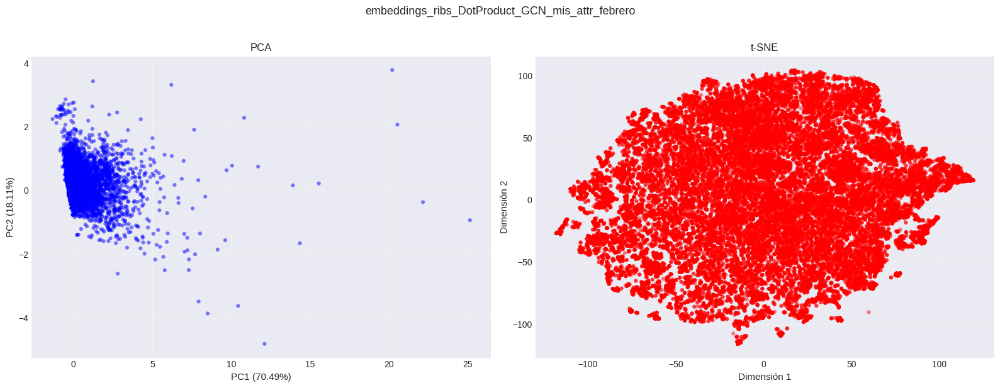


✓ Visualización completada

ANÁLISIS 2/25: embeddings_ribs_DotProduct_GraphSAGE_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.2160
   - PC1: 0.1085
   - PC2: 0.1075

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


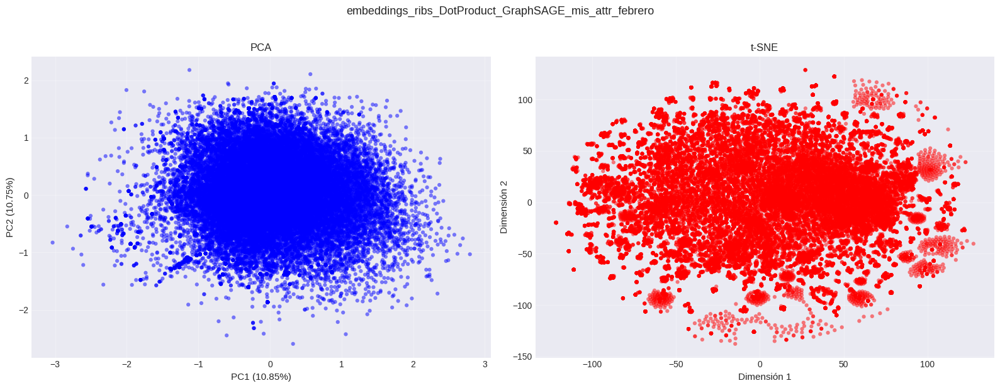


✓ Visualización completada

ANÁLISIS 3/25: embeddings_ribs_DotProduct_GAT_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.6007
   - PC1: 0.4699
   - PC2: 0.1308

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


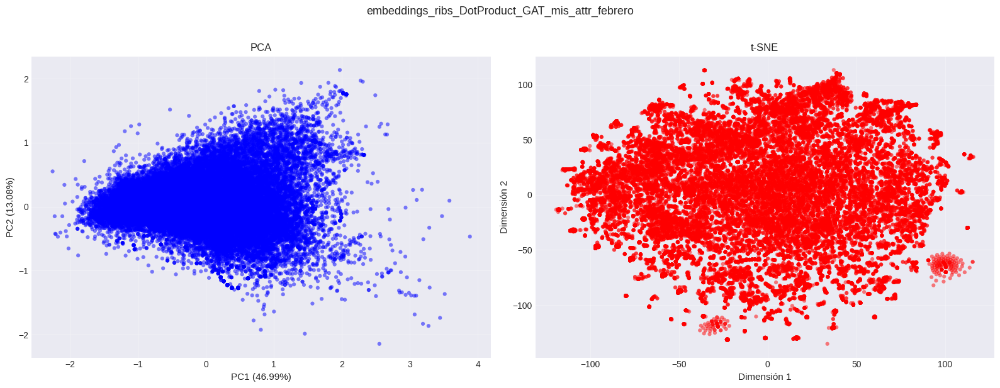


✓ Visualización completada

ANÁLISIS 4/25: embeddings_ribs_MLP_GCN_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.9988
   - PC1: 0.9939
   - PC2: 0.0049

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


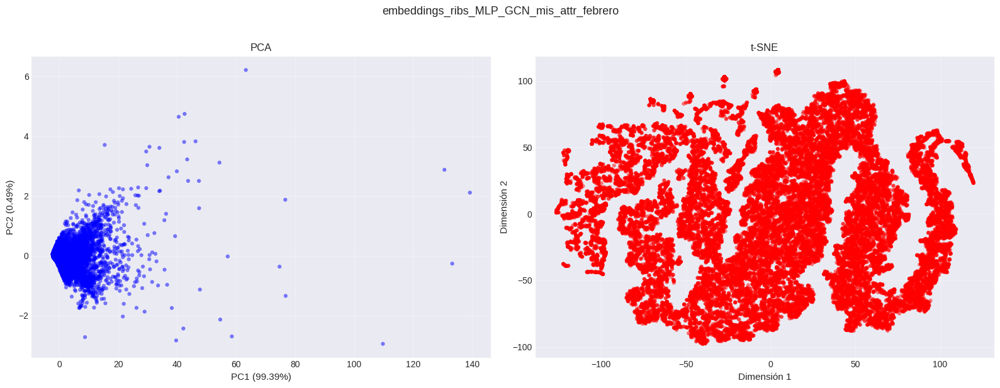


✓ Visualización completada

ANÁLISIS 5/25: embeddings_ribs_MLP_GraphSAGE_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.7521
   - PC1: 0.4714
   - PC2: 0.2807

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


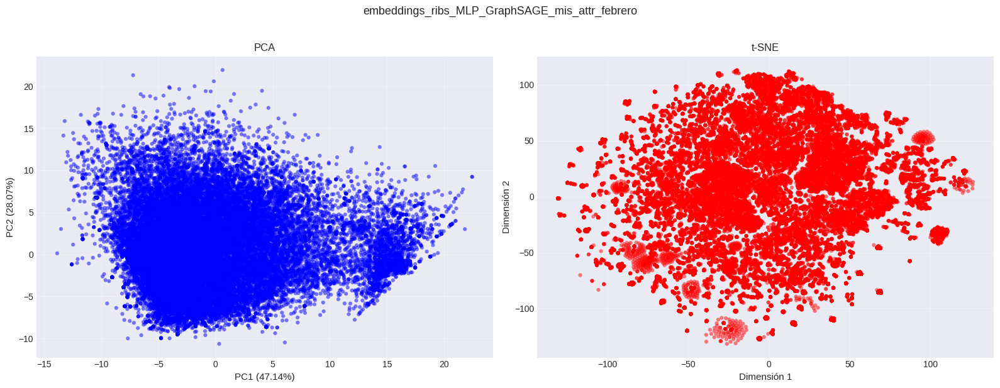


✓ Visualización completada

ANÁLISIS 6/25: embeddings_ribs_MLP_GAT_mis_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.8644
   - PC1: 0.6178
   - PC2: 0.2466

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


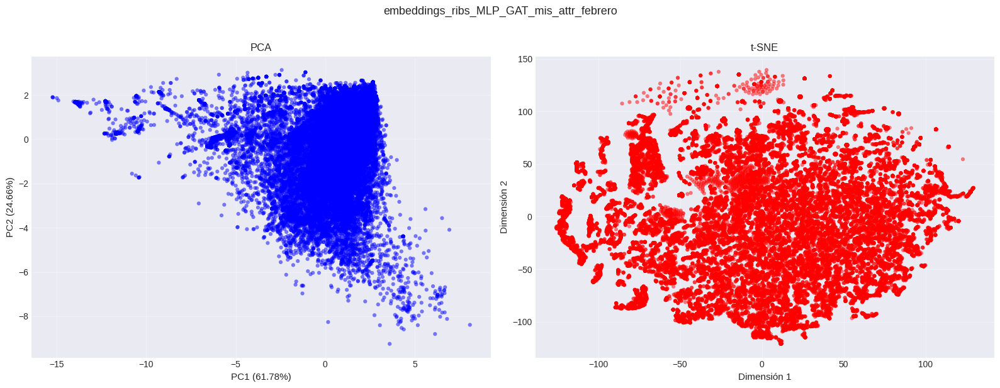


✓ Visualización completada

ANÁLISIS 7/25: embeddings_deepWalk_febrero

📊 Información de embeddings:
   • Forma: (42683, 32)
   • Dimensiones: 32
   • Número de nodos: 42683

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.2747
   - PC1: 0.1905
   - PC2: 0.0842

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


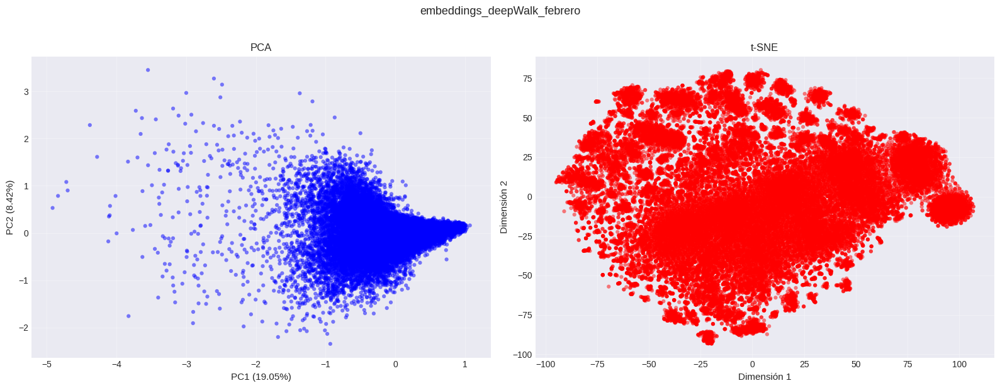


✓ Visualización completada

ANÁLISIS 8/25: embeddings_ribs_DotProduct_GCN_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.9993
   - PC1: 0.9986
   - PC2: 0.0007

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


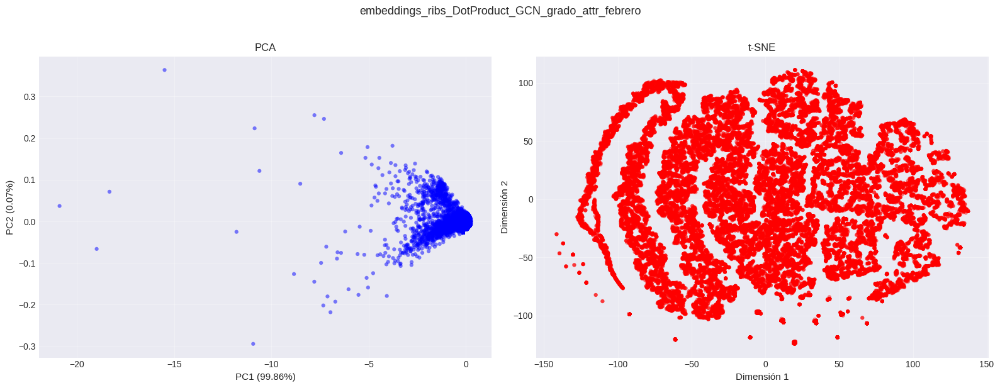


✓ Visualización completada

ANÁLISIS 9/25: embeddings_ribs_DotProduct_GraphSAGE_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.8249
   - PC1: 0.5987
   - PC2: 0.2263

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


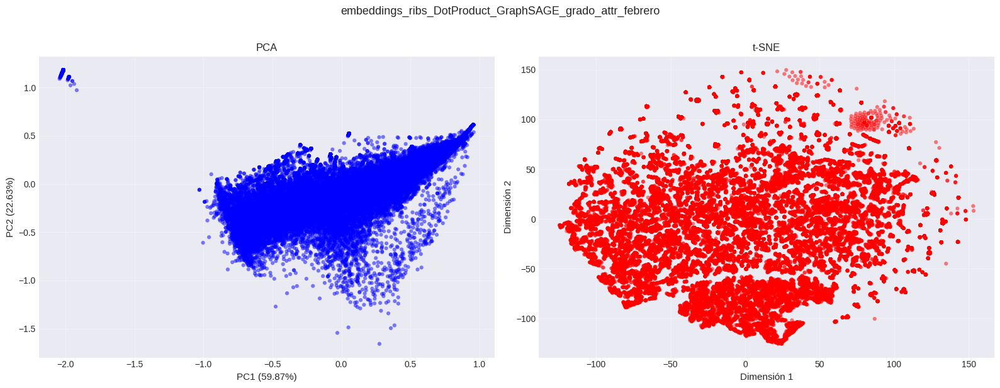


✓ Visualización completada

ANÁLISIS 10/25: embeddings_ribs_DotProduct_GAT_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.9969
   - PC1: 0.9864
   - PC2: 0.0105

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


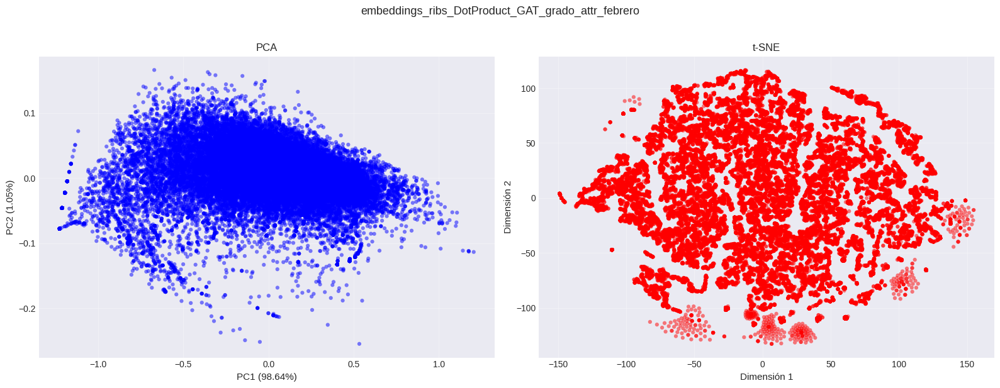


✓ Visualización completada

ANÁLISIS 11/25: embeddings_ribs_MLP_GCN_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 1.0000
   - PC1: 0.9974
   - PC2: 0.0026

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


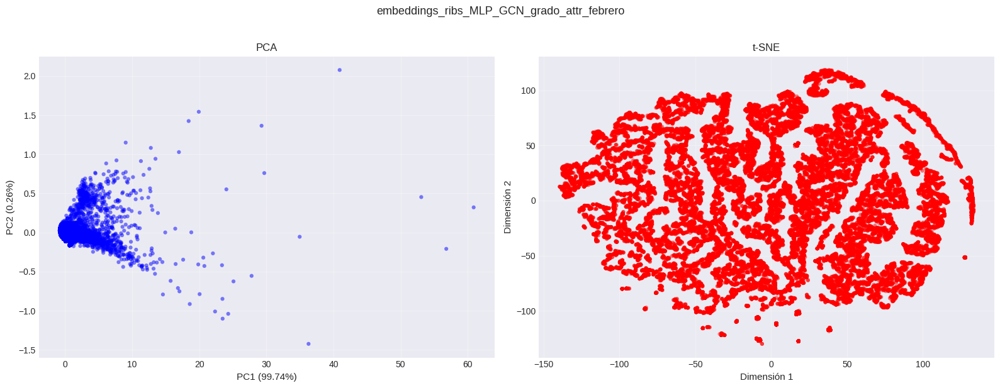


✓ Visualización completada

ANÁLISIS 12/25: embeddings_ribs_MLP_GraphSAGE_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.9418
   - PC1: 0.6195
   - PC2: 0.3224

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


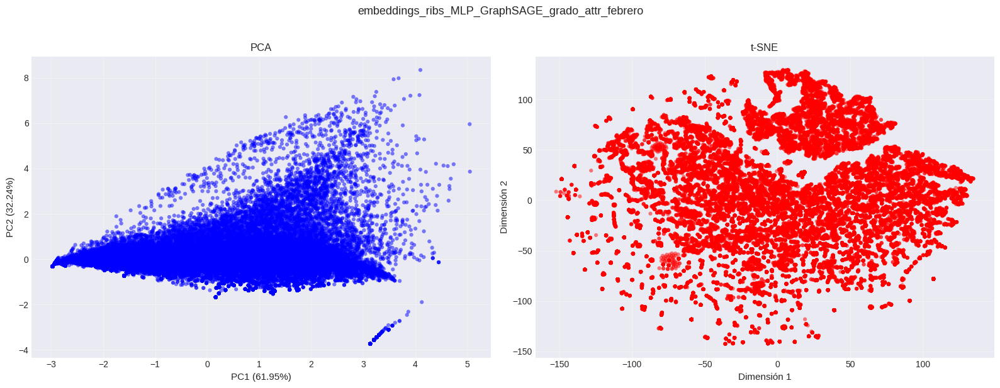


✓ Visualización completada

ANÁLISIS 13/25: embeddings_ribs_MLP_GAT_grado_attr_febrero

📊 Información de embeddings:
   • Forma: (42242, 16)
   • Dimensiones: 16
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.9995
   - PC1: 0.9949
   - PC2: 0.0046

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


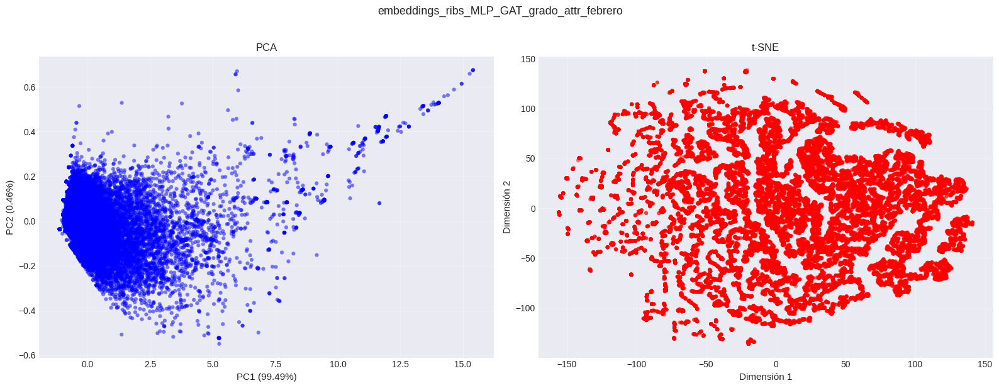


✓ Visualización completada

ANÁLISIS 14/25: embeddings_ribs_GCN_pagerank_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.6318
   - PC1: 0.5368
   - PC2: 0.0950

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


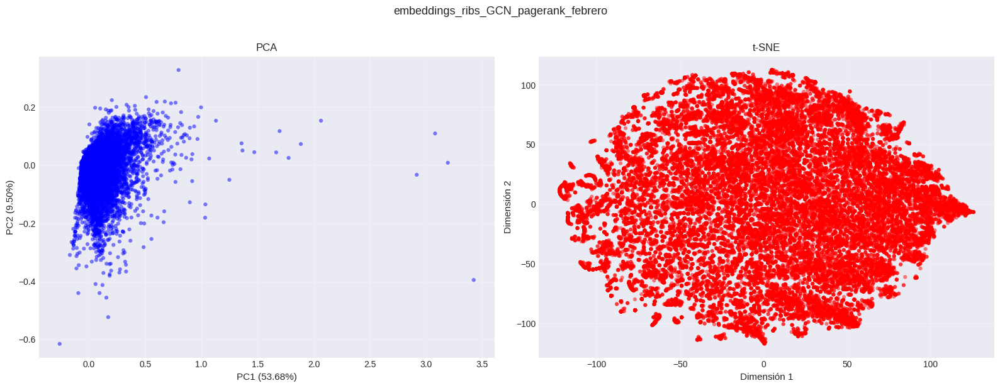


✓ Visualización completada

ANÁLISIS 15/25: embeddings_ribs_GraphSAGE_pagerank_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.3566
   - PC1: 0.2217
   - PC2: 0.1350

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


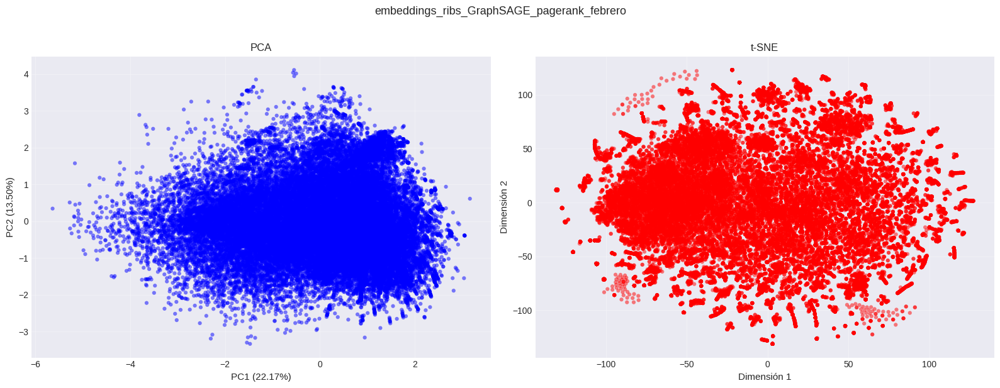


✓ Visualización completada

ANÁLISIS 16/25: embeddings_ribs_GAT_pagerank_febrero

📊 Información de embeddings:
   • Forma: (42242, 32)
   • Dimensiones: 32
   • Número de nodos: 42242

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.3882
   - PC1: 0.2340
   - PC2: 0.1541

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


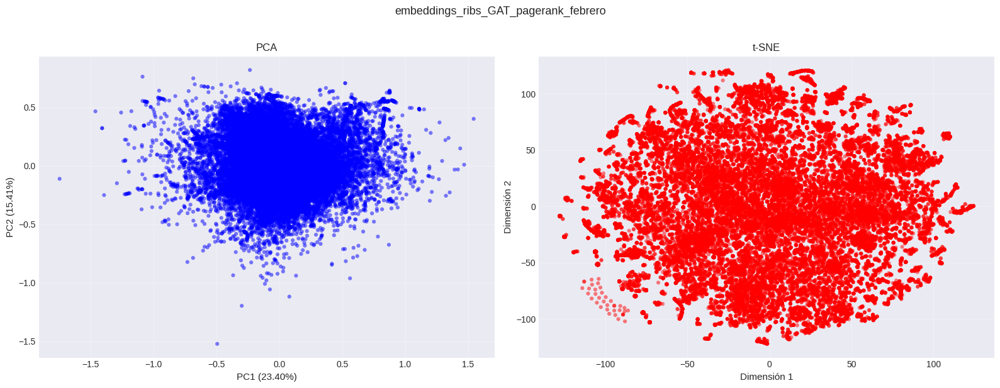


✓ Visualización completada

ANÁLISIS 17/25: embeddings_ribs_GCN_out_degree_febrero

📊 Información de embeddings:
   • Forma: (41423, 32)
   • Dimensiones: 32
   • Número de nodos: 41423

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.8194
   - PC1: 0.6797
   - PC2: 0.1396

⏳ Aplicando t-SNE (perplexity=30)...
✓ t-SNE completado


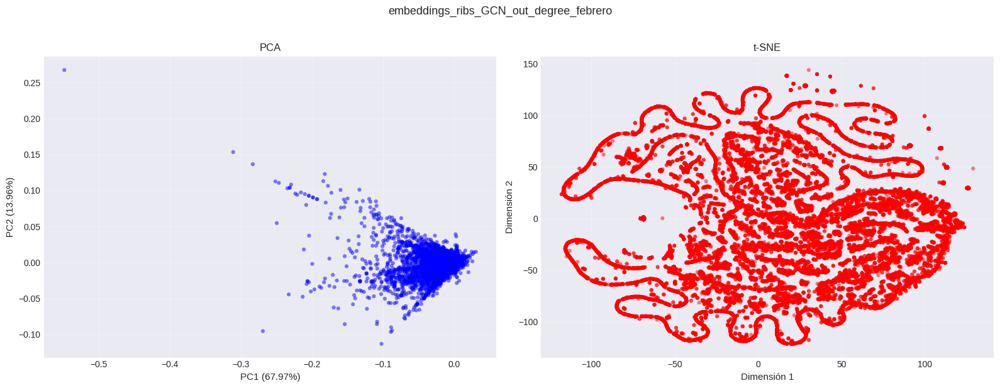


✓ Visualización completada

ANÁLISIS 18/25: embeddings_ribs_GraphSAGE_out_degree_febrero

📊 Información de embeddings:
   • Forma: (41423, 32)
   • Dimensiones: 32
   • Número de nodos: 41423

⏳ Aplicando PCA (2 componentes)...
✓ Varianza explicada: 0.4225
   - PC1: 0.2301
   - PC2: 0.1924

⏳ Aplicando t-SNE (perplexity=30)...


KeyboardInterrupt: 

In [7]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

print("=" * 70)
print("VISUALIZACIÓN DE EMBEDDINGS")
print("=" * 70)

# Convertir embeddings a numpy si es necesario
if isinstance(embeddings_pt, torch.Tensor):
    embeddings_np = embeddings_pt.cpu().detach().numpy()
else:
    embeddings_np = embeddings_pt

print(f"\n📊 Información de embeddings:")
print(f"   • Forma: {embeddings_np.shape}")
print(f"   • Dimensiones: {embeddings_np.shape[1]}")
print(f"   • Número de nodos: {embeddings_np.shape[0]}")

# Reducción con PCA
print("\n⏳ Aplicando PCA (2 componentes)...")
pca = PCA(n_components=2)
embeddings_pca = pca.fit_transform(embeddings_np)
print(f"✓ Varianza explicada: {pca.explained_variance_ratio_.sum():.4f}")
print(f"   - PC1: {pca.explained_variance_ratio_[0]:.4f}")
print(f"   - PC2: {pca.explained_variance_ratio_[1]:.4f}")

# Reducción con t-SNE
# Procesar cada embedding
for idx, embeddings_path in enumerate(embeddings_to_analyze, 1):
    embeddings_name = embeddings_path.split('/')[-1].split('.')[0]
    
    print("\n" + "=" * 70)
    print(f"ANÁLISIS {idx}/{len(embeddings_to_analyze)}: {embeddings_name}")
    print("=" * 70)
    
    try:
        # Cargar embeddings
        embeddings_pt = torch.load(embeddings_path)
        
        # Convertir a numpy si es necesario
        if isinstance(embeddings_pt, torch.Tensor):
            embeddings_np = embeddings_pt.cpu().detach().numpy()
        else:
            embeddings_np = embeddings_pt
        
        print(f"\n📊 Información de embeddings:")
        print(f"   • Forma: {embeddings_np.shape}")
        print(f"   • Dimensiones: {embeddings_np.shape[1]}")
        print(f"   • Número de nodos: {embeddings_np.shape[0]}")
        
        # Reducción con PCA
        print("\n⏳ Aplicando PCA (2 componentes)...")
        pca = PCA(n_components=2)
        embeddings_pca = pca.fit_transform(embeddings_np)
        print(f"✓ Varianza explicada: {pca.explained_variance_ratio_.sum():.4f}")
        print(f"   - PC1: {pca.explained_variance_ratio_[0]:.4f}")
        print(f"   - PC2: {pca.explained_variance_ratio_[1]:.4f}")
        
        # Reducción con t-SNE
        print("\n⏳ Aplicando t-SNE (perplexity=30)...")
        tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
        embeddings_tsne = tsne.fit_transform(embeddings_np)
        print("✓ t-SNE completado")
        
        # Visualización
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # PCA
        axes[0].scatter(embeddings_pca[:, 0], embeddings_pca[:, 1], 
                       alpha=0.5, s=20, c='blue', edgecolors='none')
        axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})', fontsize=11)
        axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})', fontsize=11)
        axes[0].set_title(f'PCA', fontsize=12)
        axes[0].grid(True, alpha=0.3)
        
        # t-SNE
        axes[1].scatter(embeddings_tsne[:, 0], embeddings_tsne[:, 1], 
                       alpha=0.5, s=20, c='red', edgecolors='none')
        axes[1].set_xlabel('Dimensión 1', fontsize=11)
        axes[1].set_ylabel('Dimensión 2', fontsize=11)
        axes[1].set_title(f't-SNE', fontsize=12)
        axes[1].grid(True, alpha=0.3)
        
        plt.suptitle(f'{embeddings_name}', fontsize=13, y=1.02)
        plt.tight_layout()
        plt.show()
        
        print("\n✓ Visualización completada")
        
    except Exception as e:
        print(f"\n✗ Error al procesar {embeddings_name}: {str(e)}")
        continue

print("\n" + "=" * 70)
print("ANÁLISIS DE VISUALIZACIÓN COMPLETADO")
print("=" * 70)

## Correlación entre embeddings y atributos


CORRELACIÓN 1/25: embeddings_ribs_DotProduct_GCN_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 11 → 0.0865
   • Correlación media (abs): 0.0596
   • Top 3 dimensiones correlacionadas:
      1. Dim 11: 0.0865
      2. Dim 15: 0.0852
      3. Dim 22: -0.0846

out_degree:
   • Correlación máxima: dim 11 → 0.0868
   • Correlación media (abs): 0.0599
   • Top 3 dimensiones correlacionadas:
      1. Dim 11: 0.0868
      2. Dim 15: 0.0855
      3. Dim 22: -0.0848

total_degree:
   • Correlación máxima: dim 11 → 0.0870
   • Correlación media (abs): 0.0600
   • Top 3 dimensiones correlacionadas:
      1. Dim 11: 0.0870
      2. Dim 15: 0.0857
      3. Dim 22: -0.0850

📈 Generando visualización...


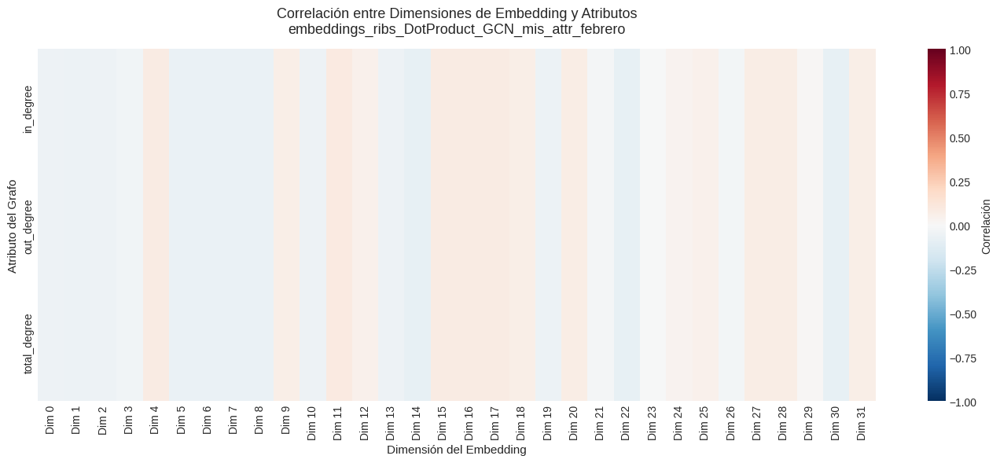

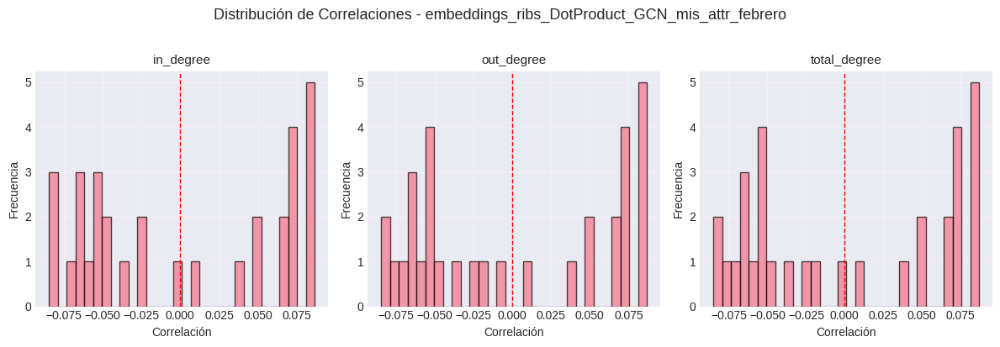


✓ Análisis de correlación completado

CORRELACIÓN 2/25: embeddings_ribs_DotProduct_GraphSAGE_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 0 → -0.0094
   • Correlación media (abs): 0.0033
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0094
      2. Dim 2: -0.0084
      3. Dim 7: -0.0068

out_degree:
   • Correlación máxima: dim 0 → -0.0101
   • Correlación media (abs): 0.0034
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0101
      2. Dim 2: -0.0075
      3. Dim 23: 0.0070

total_degree:
   • Correlación máxima: dim 0 → -0.0098
   • Correlación media (abs): 0.0033
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0098
      2. Dim 2: -0.0080
      3. Dim 15: -0.0063

📈 Generando visualización...


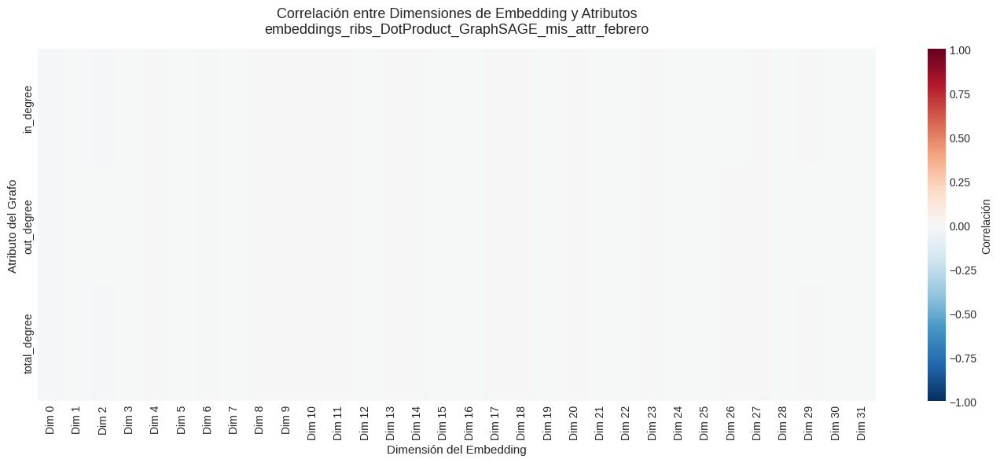

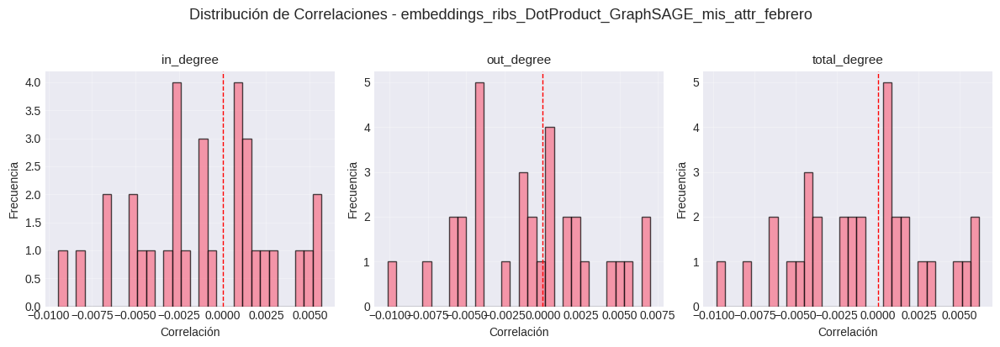


✓ Análisis de correlación completado

CORRELACIÓN 3/25: embeddings_ribs_DotProduct_GAT_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 25 → -0.0101
   • Correlación media (abs): 0.0026
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0101
      2. Dim 13: -0.0067
      3. Dim 29: -0.0066

out_degree:
   • Correlación máxima: dim 25 → -0.0103
   • Correlación media (abs): 0.0028
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0103
      2. Dim 29: -0.0076
      3. Dim 9: -0.0059

total_degree:
   • Correlación máxima: dim 25 → -0.0102
   • Correlación media (abs): 0.0026
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0102
      2. Dim 29: -0.0071
      3. Dim 13: -0.0063

📈 Generando visualización...


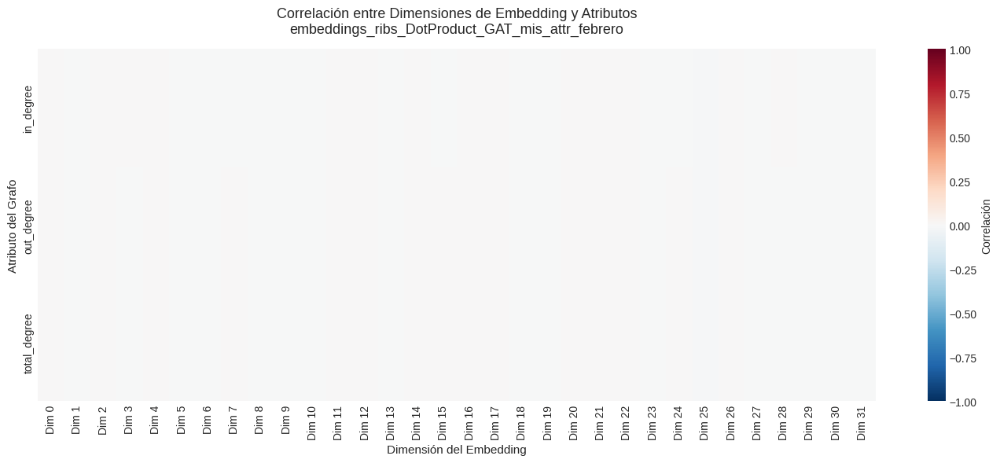

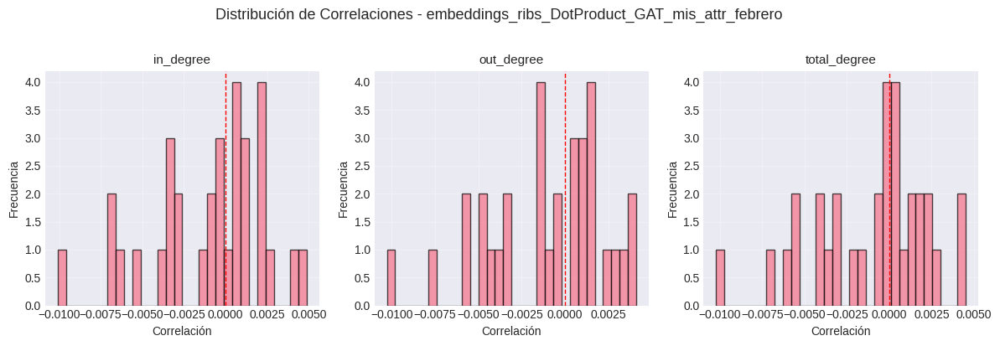


✓ Análisis de correlación completado

CORRELACIÓN 4/25: embeddings_ribs_MLP_GCN_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 4 → 0.0883
   • Correlación media (abs): 0.0798
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: 0.0883
      2. Dim 3: -0.0844
      3. Dim 14: -0.0828

out_degree:
   • Correlación máxima: dim 4 → 0.0889
   • Correlación media (abs): 0.0805
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: 0.0889
      2. Dim 3: -0.0850
      3. Dim 14: -0.0834

total_degree:
   • Correlación máxima: dim 4 → 0.0889
   • Correlación media (abs): 0.0805
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: 0.0889
      2. Dim 3: -0.0850
      3. Dim 14: -0.0835

📈 Generando visualización...


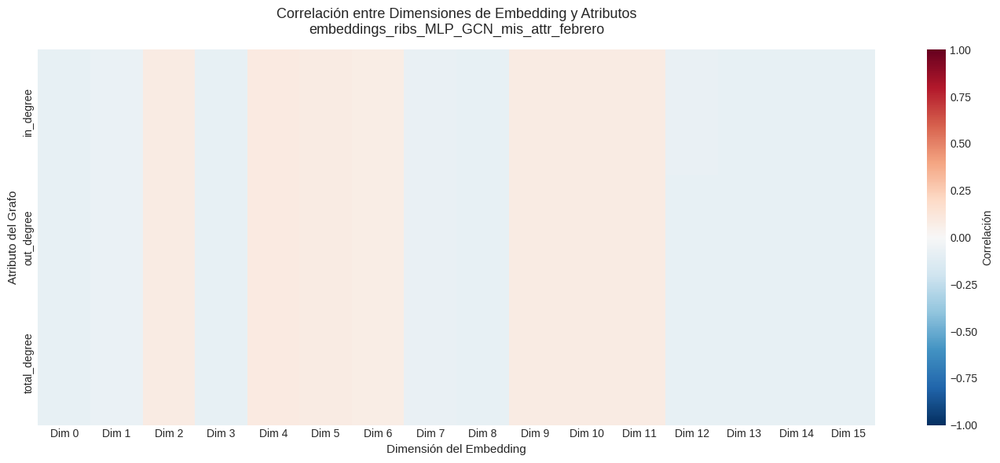

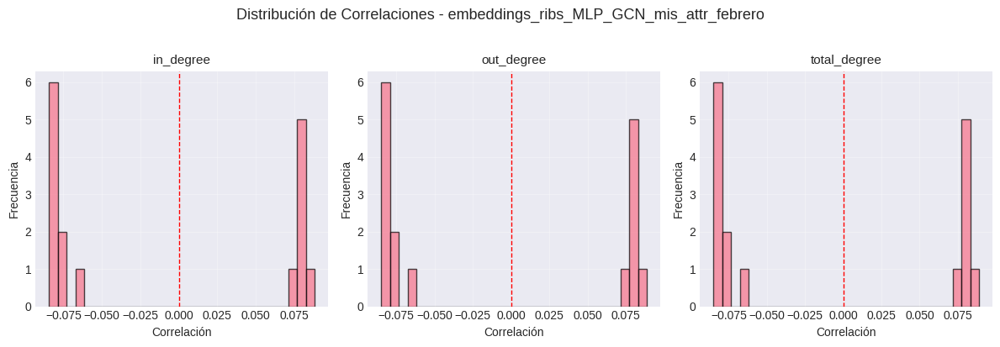


✓ Análisis de correlación completado

CORRELACIÓN 5/25: embeddings_ribs_MLP_GraphSAGE_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 5 → -0.0157
   • Correlación media (abs): 0.0068
   • Top 3 dimensiones correlacionadas:
      1. Dim 5: -0.0157
      2. Dim 10: 0.0143
      3. Dim 12: -0.0135

out_degree:
   • Correlación máxima: dim 5 → -0.0182
   • Correlación media (abs): 0.0074
   • Top 3 dimensiones correlacionadas:
      1. Dim 5: -0.0182
      2. Dim 12: -0.0167
      3. Dim 0: 0.0156

total_degree:
   • Correlación máxima: dim 5 → -0.0171
   • Correlación media (abs): 0.0071
   • Top 3 dimensiones correlacionadas:
      1. Dim 5: -0.0171
      2. Dim 12: -0.0152
      3. Dim 0: 0.0146

📈 Generando visualización...


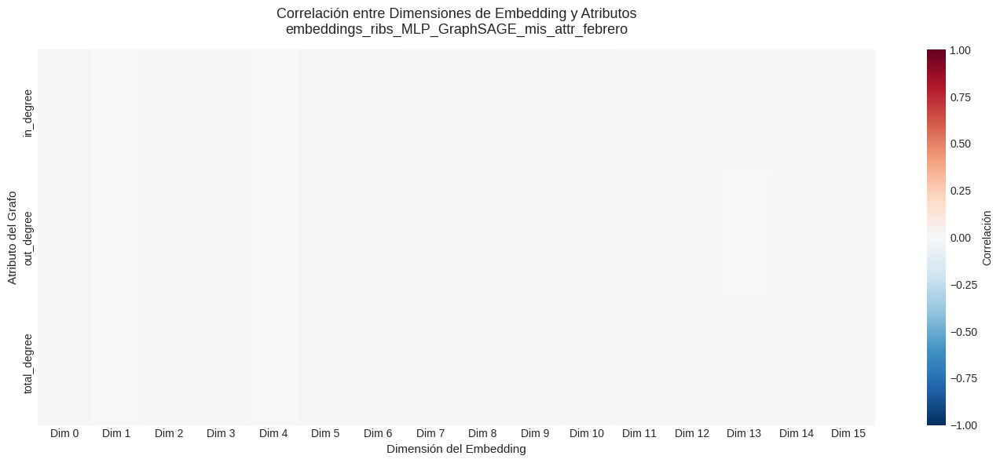

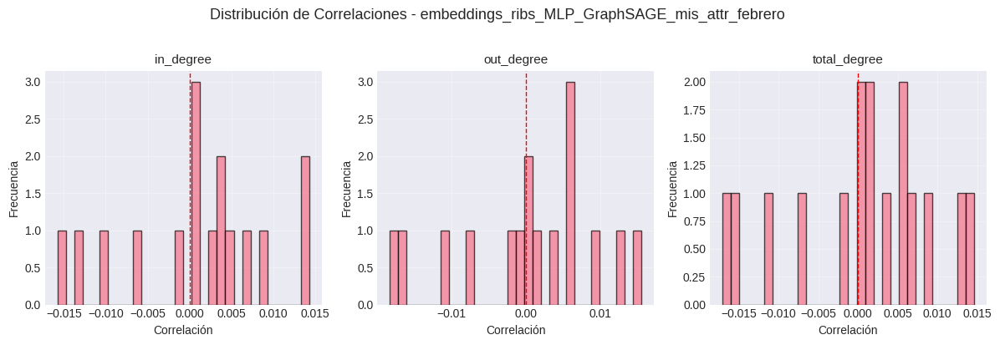


✓ Análisis de correlación completado

CORRELACIÓN 6/25: embeddings_ribs_MLP_GAT_mis_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 8 → 0.0124
   • Correlación media (abs): 0.0085
   • Top 3 dimensiones correlacionadas:
      1. Dim 8: 0.0124
      2. Dim 4: -0.0118
      3. Dim 15: -0.0112

out_degree:
   • Correlación máxima: dim 8 → 0.0146
   • Correlación media (abs): 0.0098
   • Top 3 dimensiones correlacionadas:
      1. Dim 8: 0.0146
      2. Dim 4: -0.0140
      3. Dim 6: 0.0127

total_degree:
   • Correlación máxima: dim 8 → 0.0136
   • Correlación media (abs): 0.0092
   • Top 3 dimensiones correlacionadas:
      1. Dim 8: 0.0136
      2. Dim 4: -0.0130
      3. Dim 15: -0.0118

📈 Generando visualización...


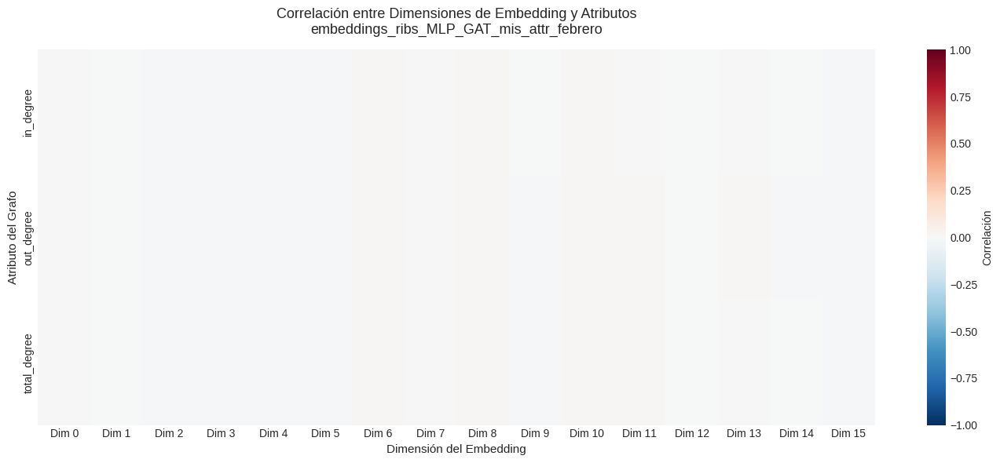

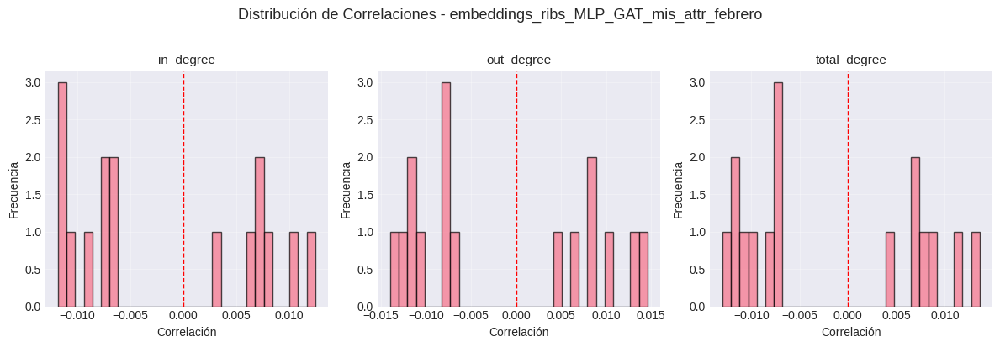


✓ Análisis de correlación completado

CORRELACIÓN 7/25: embeddings_deepWalk_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42683
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 21 → 0.0178
   • Correlación media (abs): 0.0057
   • Top 3 dimensiones correlacionadas:
      1. Dim 21: 0.0178
      2. Dim 28: -0.0147
      3. Dim 1: 0.0138

out_degree:
   • Correlación máxima: dim 21 → 0.0178
   • Correlación media (abs): 0.0060
   • Top 3 dimensiones correlacionadas:
      1. Dim 21: 0.0178
      2. Dim 1: 0.0141
      3. Dim 28: -0.0138

total_degree:
   • Correlación máxima: dim 21 → 0.0179
   • Correlación media (abs): 0.0059
   • Top 3 dimensiones correlacionadas:
      1. Dim 21: 0.0179
      2. Dim 28: -0.0143
      3. Dim 1: 0.0140

📈 Generando visualización...


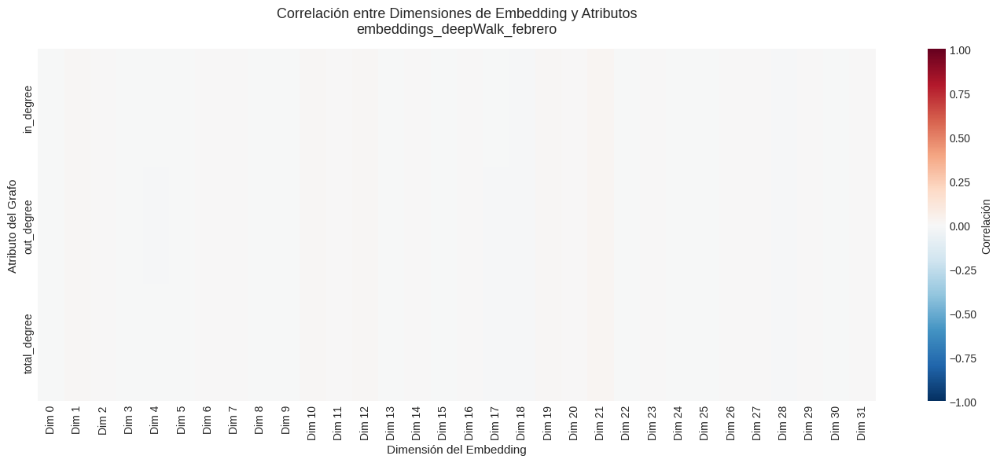

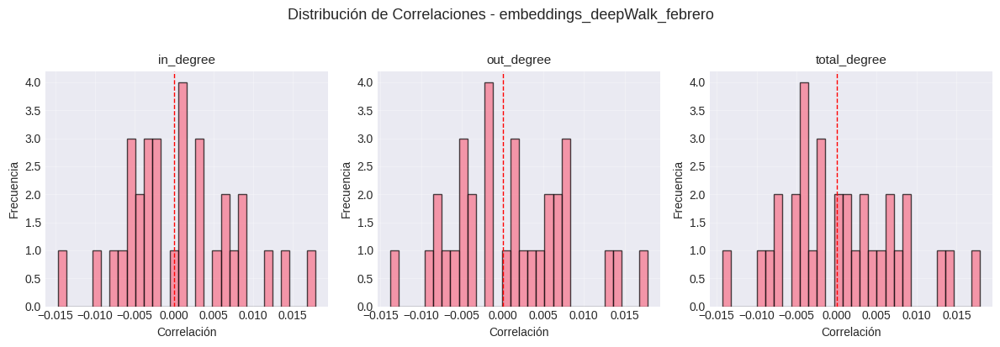


✓ Análisis de correlación completado

CORRELACIÓN 8/25: embeddings_ribs_DotProduct_GCN_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 1 → -0.0912
   • Correlación media (abs): 0.0895
   • Top 3 dimensiones correlacionadas:
      1. Dim 1: -0.0912
      2. Dim 24: -0.0908
      3. Dim 4: -0.0907

out_degree:
   • Correlación máxima: dim 1 → -0.0916
   • Correlación media (abs): 0.0900
   • Top 3 dimensiones correlacionadas:
      1. Dim 1: -0.0916
      2. Dim 24: -0.0912
      3. Dim 4: -0.0911

total_degree:
   • Correlación máxima: dim 1 → -0.0917
   • Correlación media (abs): 0.0901
   • Top 3 dimensiones correlacionadas:
      1. Dim 1: -0.0917
      2. Dim 24: -0.0913
      3. Dim 4: -0.0913

📈 Generando visualización...


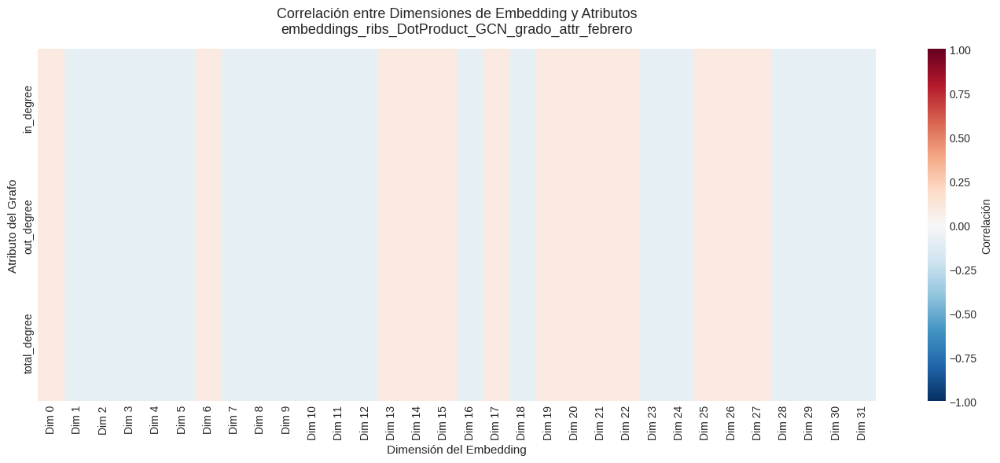

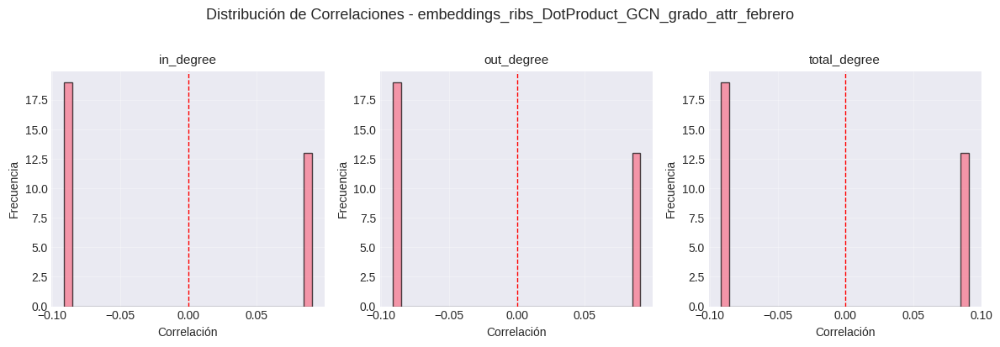


✓ Análisis de correlación completado

CORRELACIÓN 9/25: embeddings_ribs_DotProduct_GraphSAGE_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 6 → 0.0305
   • Correlación media (abs): 0.0097
   • Top 3 dimensiones correlacionadas:
      1. Dim 6: 0.0305
      2. Dim 4: 0.0266
      3. Dim 30: 0.0218

out_degree:
   • Correlación máxima: dim 6 → 0.0319
   • Correlación media (abs): 0.0102
   • Top 3 dimensiones correlacionadas:
      1. Dim 6: 0.0319
      2. Dim 4: 0.0274
      3. Dim 30: 0.0236

total_degree:
   • Correlación máxima: dim 6 → 0.0313
   • Correlación media (abs): 0.0100
   • Top 3 dimensiones correlacionadas:
      1. Dim 6: 0.0313
      2. Dim 4: 0.0271
      3. Dim 30: 0.0228

📈 Generando visualización...


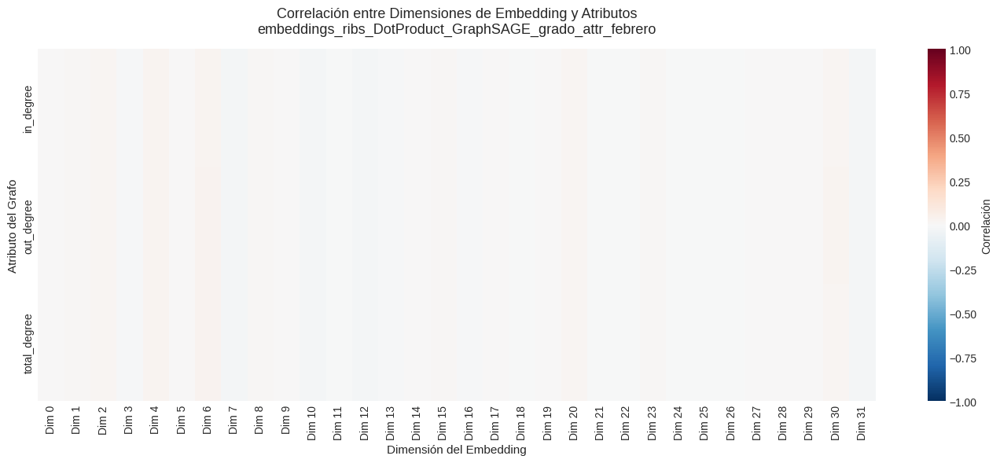

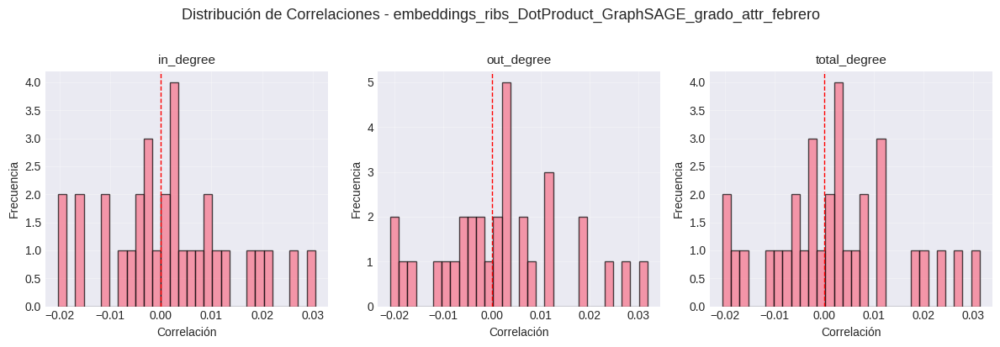


✓ Análisis de correlación completado

CORRELACIÓN 10/25: embeddings_ribs_DotProduct_GAT_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 29 → 0.0080
   • Correlación media (abs): 0.0068
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.0080
      2. Dim 6: 0.0078
      3. Dim 24: 0.0076

out_degree:
   • Correlación máxima: dim 29 → 0.0081
   • Correlación media (abs): 0.0068
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.0081
      2. Dim 6: 0.0078
      3. Dim 24: 0.0076

total_degree:
   • Correlación máxima: dim 29 → 0.0081
   • Correlación media (abs): 0.0068
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.0081
      2. Dim 6: 0.0078
      3. Dim 24: 0.0077

📈 Generando visualización...


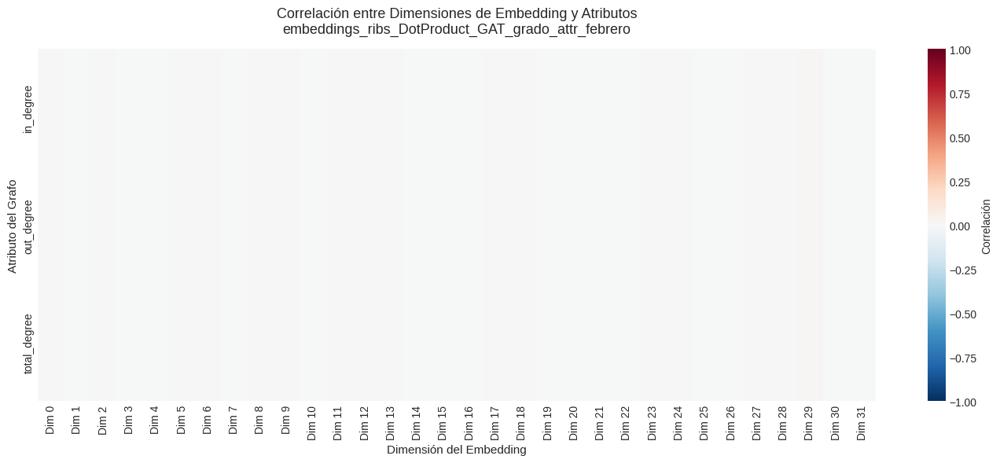

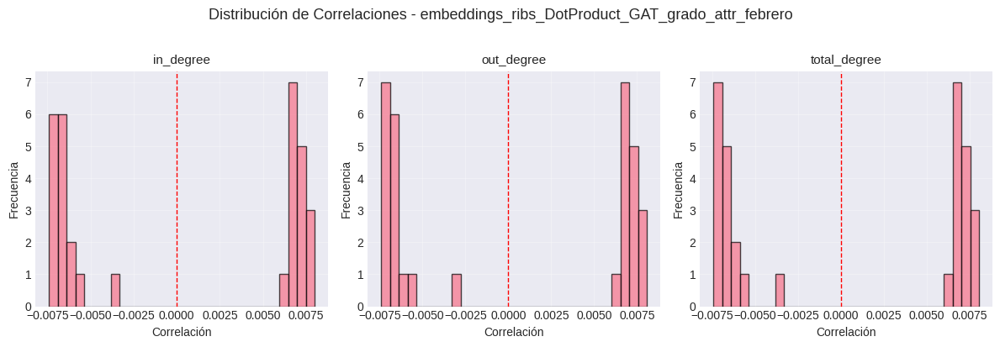


✓ Análisis de correlación completado

CORRELACIÓN 11/25: embeddings_ribs_MLP_GCN_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 14 → -0.0897
   • Correlación media (abs): 0.0883
   • Top 3 dimensiones correlacionadas:
      1. Dim 14: -0.0897
      2. Dim 10: -0.0896
      3. Dim 9: -0.0896

out_degree:
   • Correlación máxima: dim 14 → -0.0901
   • Correlación media (abs): 0.0889
   • Top 3 dimensiones correlacionadas:
      1. Dim 14: -0.0901
      2. Dim 9: -0.0901
      3. Dim 10: -0.0901

total_degree:
   • Correlación máxima: dim 14 → -0.0903
   • Correlación media (abs): 0.0889
   • Top 3 dimensiones correlacionadas:
      1. Dim 14: -0.0903
      2. Dim 9: -0.0902
      3. Dim 10: -0.0902

📈 Generando visualización...


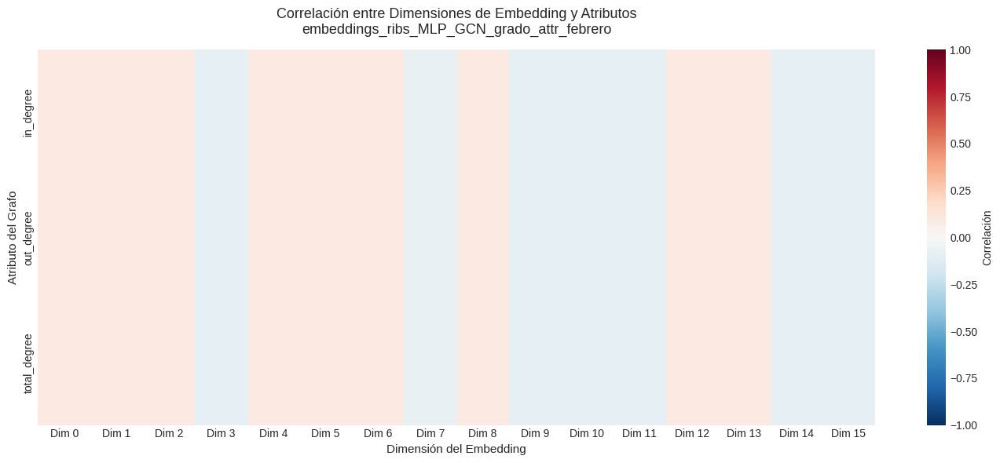

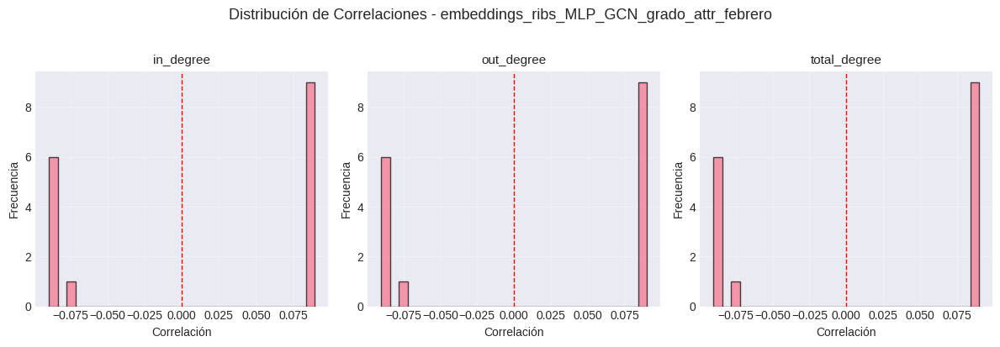


✓ Análisis de correlación completado

CORRELACIÓN 12/25: embeddings_ribs_MLP_GraphSAGE_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 13 → -0.0250
   • Correlación media (abs): 0.0164
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0250
      2. Dim 9: 0.0223
      3. Dim 1: -0.0212

out_degree:
   • Correlación máxima: dim 13 → -0.0270
   • Correlación media (abs): 0.0180
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0270
      2. Dim 9: 0.0255
      3. Dim 1: -0.0239

total_degree:
   • Correlación máxima: dim 13 → -0.0261
   • Correlación media (abs): 0.0173
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0261
      2. Dim 9: 0.0240
      3. Dim 1: -0.0227

📈 Generando visualización...


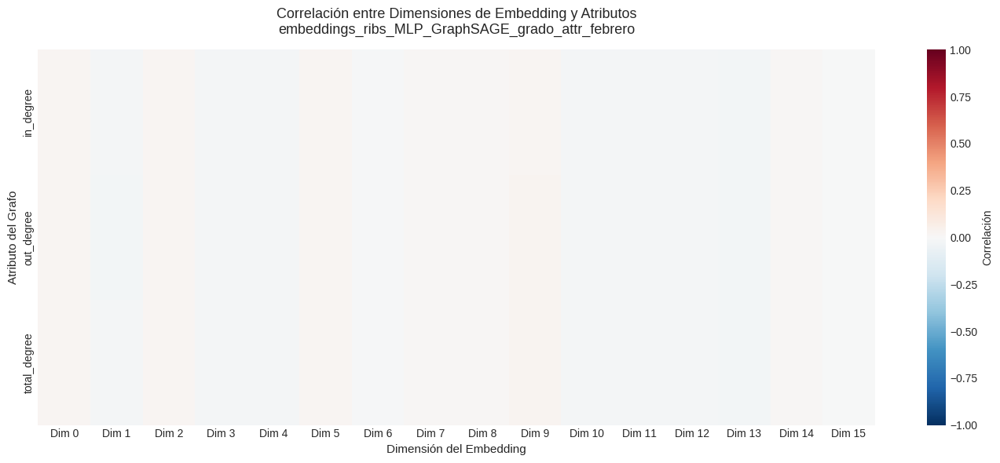

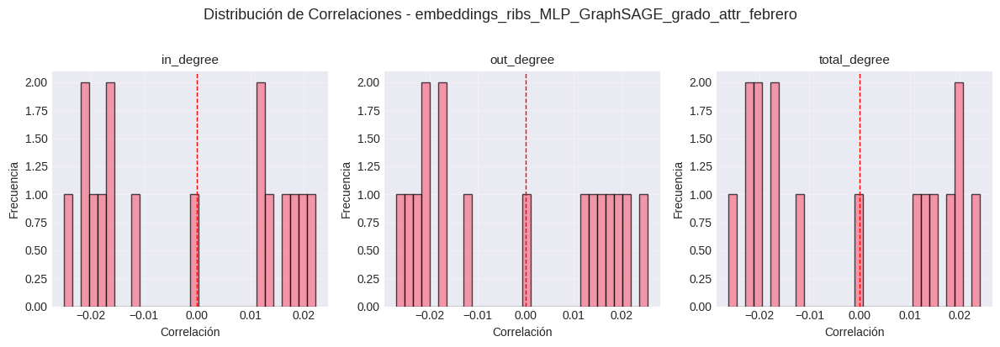


✓ Análisis de correlación completado

CORRELACIÓN 13/25: embeddings_ribs_MLP_GAT_grado_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 0 → -0.0356
   • Correlación media (abs): 0.0301
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0356
      2. Dim 11: 0.0326
      3. Dim 12: 0.0311

out_degree:
   • Correlación máxima: dim 0 → -0.0373
   • Correlación media (abs): 0.0321
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0373
      2. Dim 11: 0.0345
      3. Dim 12: 0.0331

total_degree:
   • Correlación máxima: dim 0 → -0.0366
   • Correlación media (abs): 0.0312
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: -0.0366
      2. Dim 11: 0.0337
      3. Dim 12: 0.0322

📈 Generando visualización...


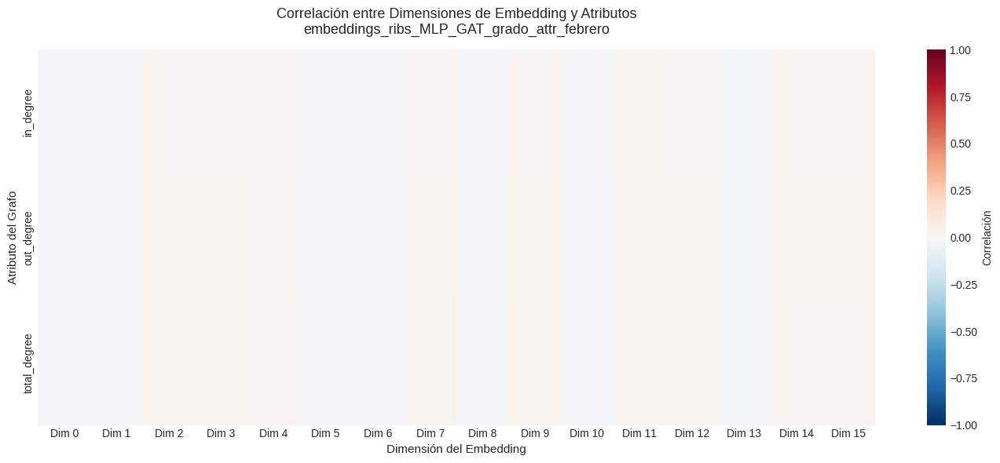

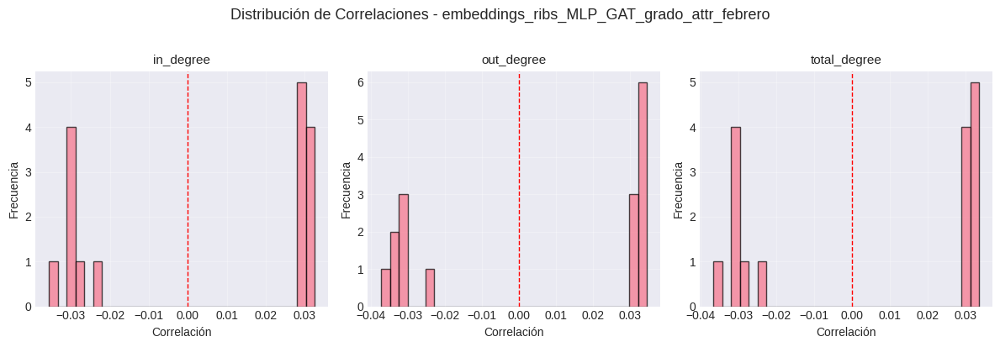


✓ Análisis de correlación completado

CORRELACIÓN 14/25: embeddings_ribs_GCN_pagerank_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 13 → -0.0613
   • Correlación media (abs): 0.0318
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0613
      2. Dim 24: 0.0608
      3. Dim 0: 0.0599

out_degree:
   • Correlación máxima: dim 13 → -0.0627
   • Correlación media (abs): 0.0322
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0627
      2. Dim 24: 0.0617
      3. Dim 0: 0.0607

total_degree:
   • Correlación máxima: dim 13 → -0.0622
   • Correlación media (abs): 0.0321
   • Top 3 dimensiones correlacionadas:
      1. Dim 13: -0.0622
      2. Dim 24: 0.0615
      3. Dim 0: 0.0605

📈 Generando visualización...


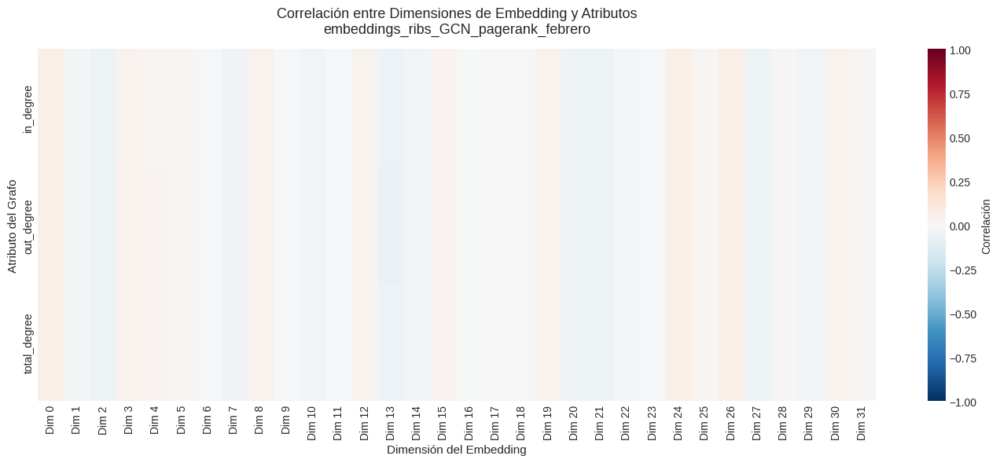

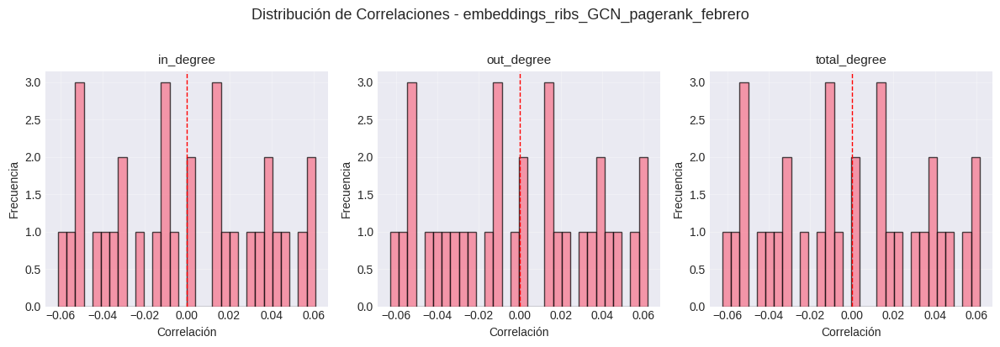


✓ Análisis de correlación completado

CORRELACIÓN 15/25: embeddings_ribs_GraphSAGE_pagerank_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 27 → 0.0124
   • Correlación media (abs): 0.0027
   • Top 3 dimensiones correlacionadas:
      1. Dim 27: 0.0124
      2. Dim 19: 0.0060
      3. Dim 21: -0.0055

out_degree:
   • Correlación máxima: dim 27 → 0.0118
   • Correlación media (abs): 0.0028
   • Top 3 dimensiones correlacionadas:
      1. Dim 27: 0.0118
      2. Dim 24: -0.0076
      3. Dim 31: -0.0056

total_degree:
   • Correlación máxima: dim 27 → 0.0121
   • Correlación media (abs): 0.0027
   • Top 3 dimensiones correlacionadas:
      1. Dim 27: 0.0121
      2. Dim 24: -0.0063
      3. Dim 21: -0.0055

📈 Generando visualización...


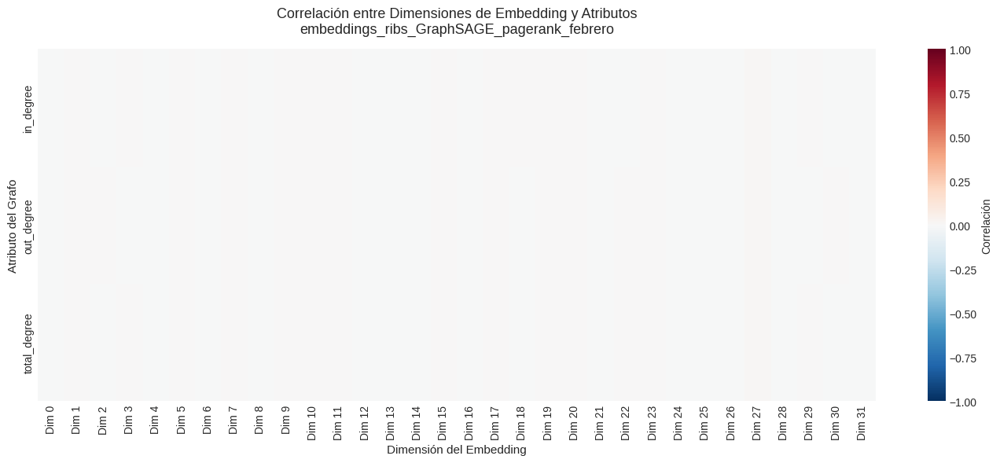

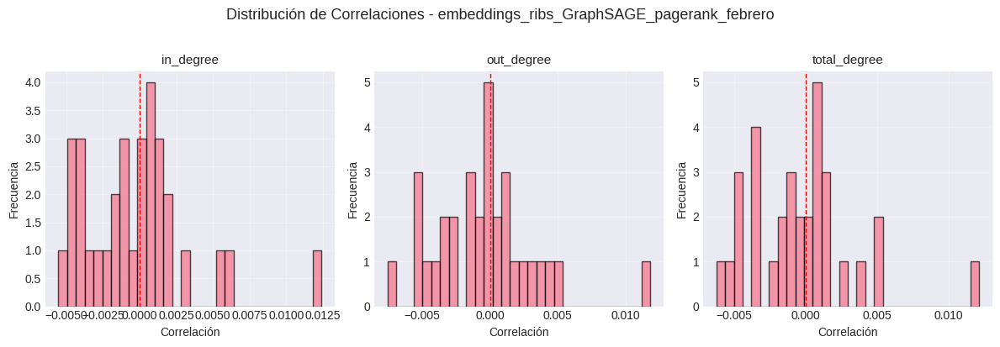


✓ Análisis de correlación completado

CORRELACIÓN 16/25: embeddings_ribs_GAT_pagerank_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 42242
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 26 → 0.0136
   • Correlación media (abs): 0.0041
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0136
      2. Dim 17: -0.0095
      3. Dim 12: -0.0090

out_degree:
   • Correlación máxima: dim 26 → 0.0144
   • Correlación media (abs): 0.0045
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0144
      2. Dim 17: -0.0115
      3. Dim 12: -0.0101

total_degree:
   • Correlación máxima: dim 26 → 0.0141
   • Correlación media (abs): 0.0043
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0141
      2. Dim 17: -0.0105
      3. Dim 12: -0.0096

📈 Generando visualización...


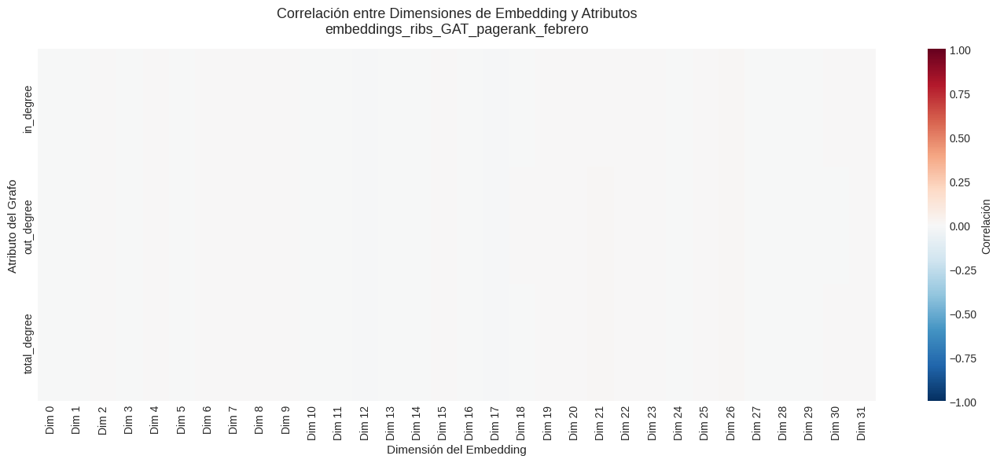

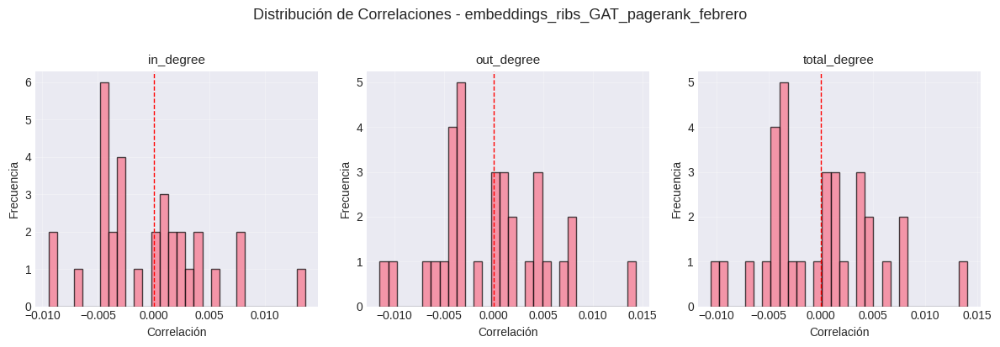


✓ Análisis de correlación completado

CORRELACIÓN 17/25: embeddings_ribs_GCN_out_degree_febrero

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 29 → 0.2051
   • Correlación media (abs): 0.1325
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.2051
      2. Dim 11: 0.1961
      3. Dim 23: -0.1911

out_degree:
   • Correlación máxima: dim 29 → 0.2119
   • Correlación media (abs): 0.1365
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.2119
      2. Dim 11: 0.2028
      3. Dim 23: -0.1971

total_degree:
   • Correlación máxima: dim 29 → 0.2093
   • Correlación media (abs): 0.1351
   • Top 3 dimensiones correlacionadas:
      1. Dim 29: 0.2093
      2. Dim 11: 0.2003
      3. Dim 23: -0.1949

📈 Generando visualización...


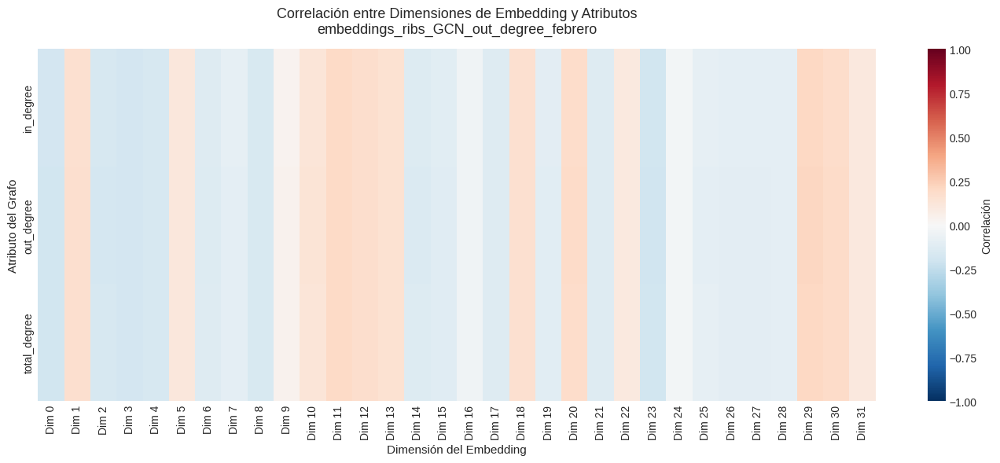

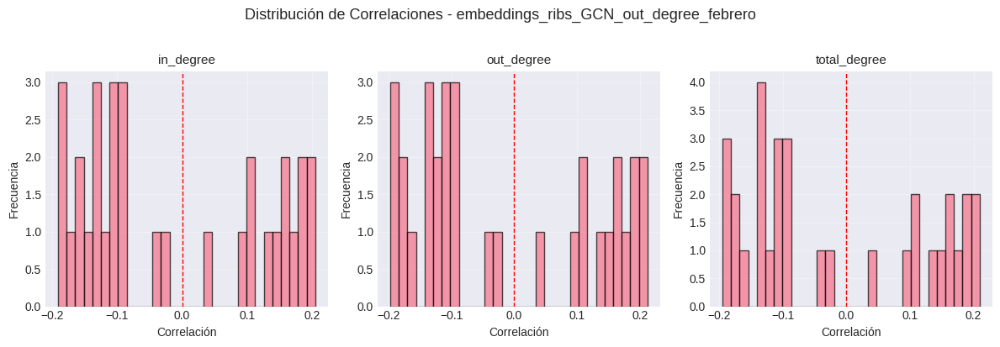


✓ Análisis de correlación completado

CORRELACIÓN 18/25: embeddings_ribs_GraphSAGE_out_degree_febrero

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 10 → -0.0196
   • Correlación media (abs): 0.0071
   • Top 3 dimensiones correlacionadas:
      1. Dim 10: -0.0196
      2. Dim 30: 0.0192
      3. Dim 0: -0.0164

out_degree:
   • Correlación máxima: dim 10 → -0.0313
   • Correlación media (abs): 0.0132
   • Top 3 dimensiones correlacionadas:
      1. Dim 10: -0.0313
      2. Dim 30: 0.0311
      3. Dim 9: -0.0301

total_degree:
   • Correlación máxima: dim 10 → -0.0257
   • Correlación media (abs): 0.0101
   • Top 3 dimensiones correlacionadas:
      1. Dim 10: -0.0257
      2. Dim 30: 0.0253
      3. Dim 5: 0.0223

📈 Generando visualización...


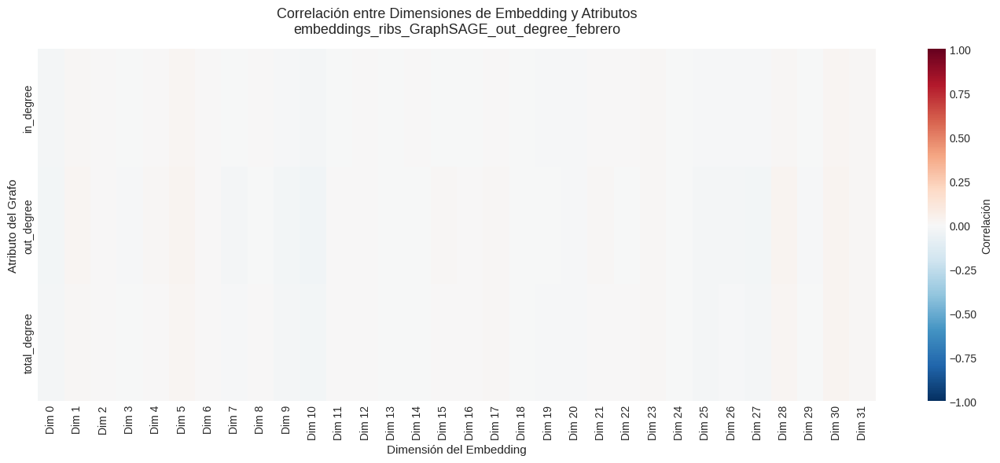

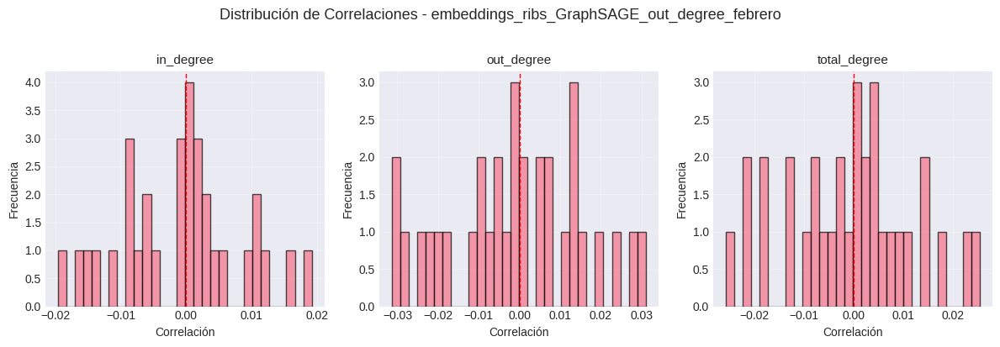


✓ Análisis de correlación completado

CORRELACIÓN 19/25: embeddings_ribs_GAT_out_degree_febrero

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 28 → 0.0267
   • Correlación media (abs): 0.0100
   • Top 3 dimensiones correlacionadas:
      1. Dim 28: 0.0267
      2. Dim 1: -0.0184
      3. Dim 5: 0.0182

out_degree:
   • Correlación máxima: dim 28 → 0.0286
   • Correlación media (abs): 0.0134
   • Top 3 dimensiones correlacionadas:
      1. Dim 28: 0.0286
      2. Dim 18: -0.0226
      3. Dim 1: -0.0225

total_degree:
   • Correlación máxima: dim 28 → 0.0278
   • Correlación media (abs): 0.0118
   • Top 3 dimensiones correlacionadas:
      1. Dim 28: 0.0278
      2. Dim 1: -0.0206
      3. Dim 5: 0.0195

📈 Generando visualización...


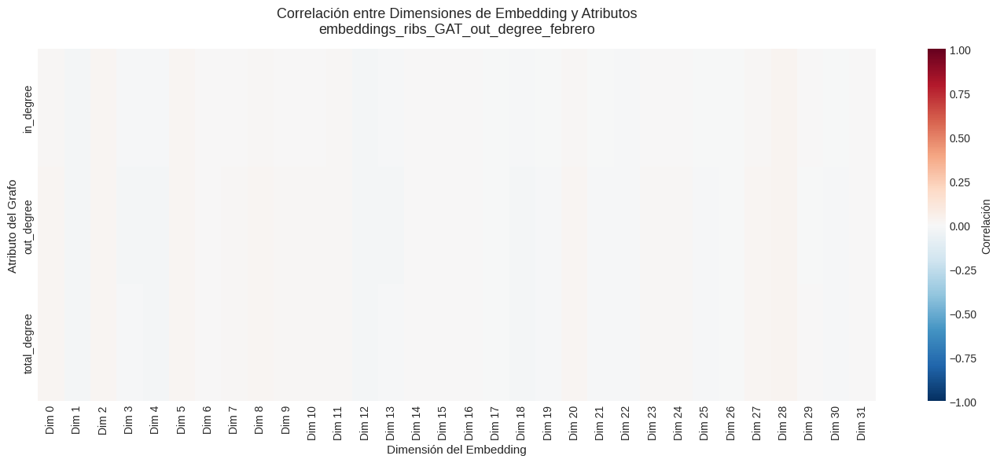

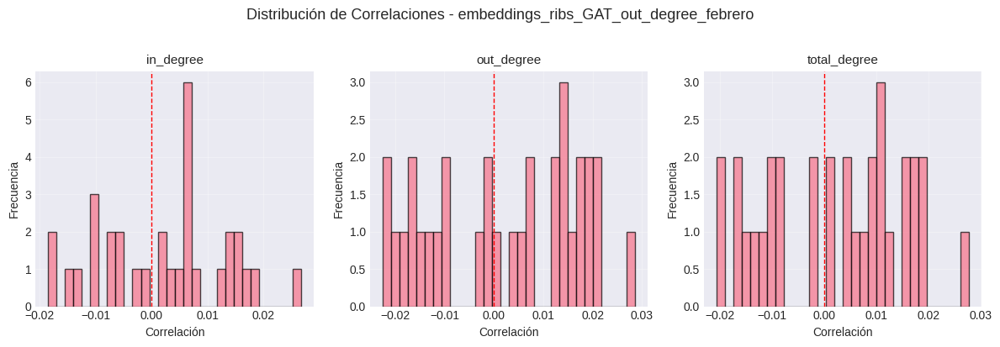


✓ Análisis de correlación completado

CORRELACIÓN 20/25: embeddings_ribs_DotProduct_GCN_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 25 → -0.0100
   • Correlación media (abs): 0.0038
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0100
      2. Dim 5: 0.0086
      3. Dim 12: 0.0072

out_degree:
   • Correlación máxima: dim 25 → -0.0098
   • Correlación media (abs): 0.0036
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0098
      2. Dim 12: 0.0079
      3. Dim 5: 0.0072

total_degree:
   • Correlación máxima: dim 25 → -0.0099
   • Correlación media (abs): 0.0037
   • Top 3 dimensiones correlacionadas:
      1. Dim 25: -0.0099
      2. Dim 5: 0.0079
      3. Dim 12: 0.0076

📈 Generando visualización...


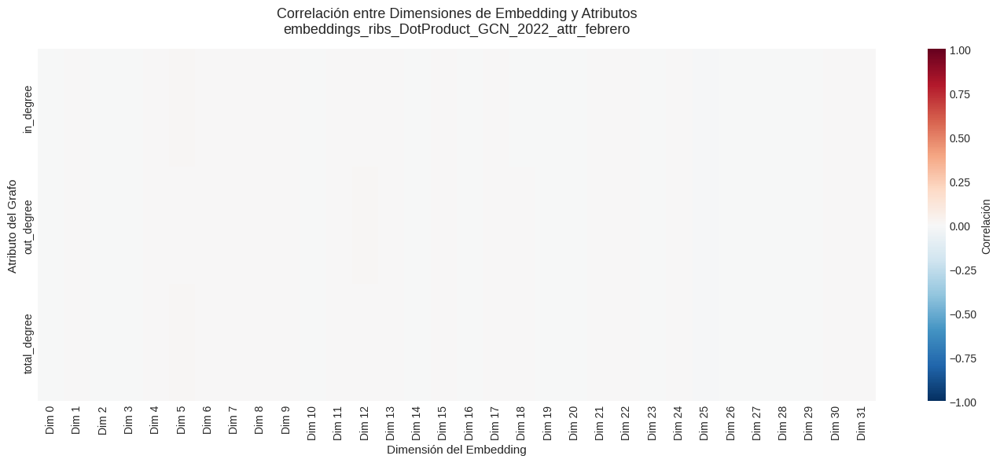

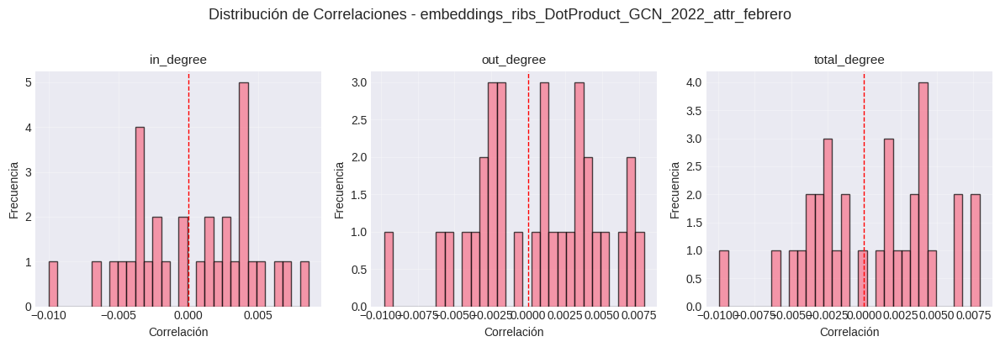


✓ Análisis de correlación completado

CORRELACIÓN 21/25: embeddings_ribs_DotProduct_GraphSAGE_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 26 → 0.0155
   • Correlación media (abs): 0.0059
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0155
      2. Dim 12: 0.0142
      3. Dim 5: -0.0135

out_degree:
   • Correlación máxima: dim 26 → 0.0163
   • Correlación media (abs): 0.0059
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0163
      2. Dim 4: 0.0141
      3. Dim 12: 0.0132

total_degree:
   • Correlación máxima: dim 26 → 0.0159
   • Correlación media (abs): 0.0059
   • Top 3 dimensiones correlacionadas:
      1. Dim 26: 0.0159
      2. Dim 12: 0.0137
      3. Dim 4: 0.0136

📈 Generando visualización...


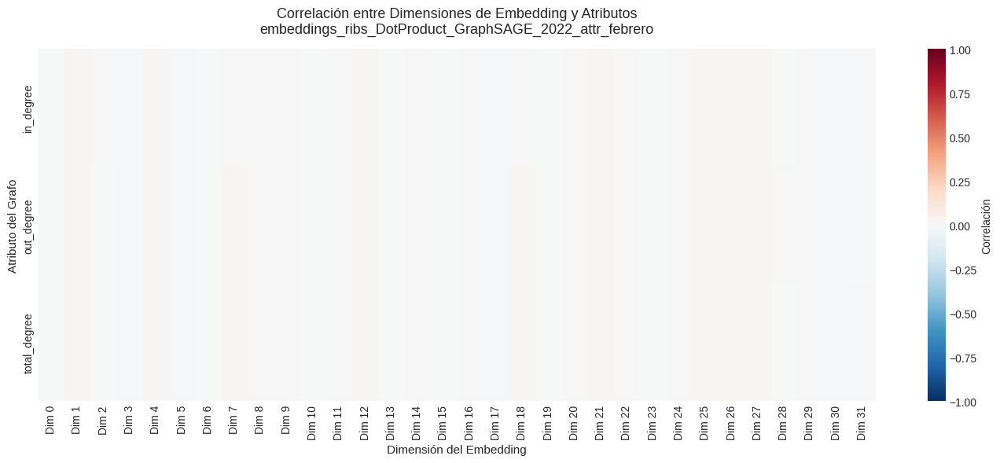

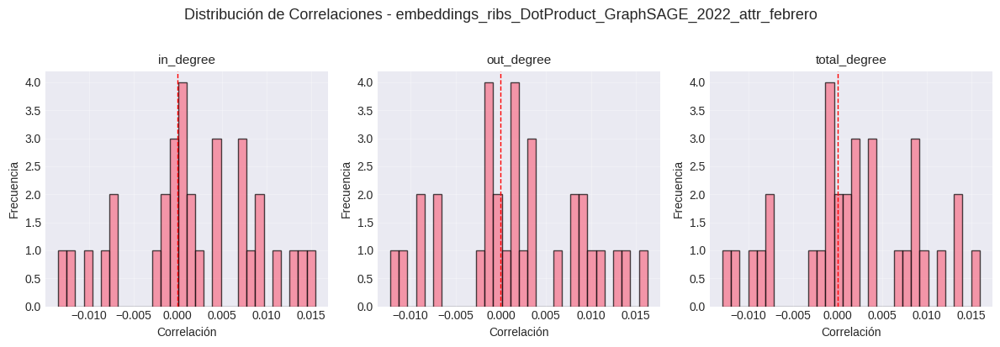


✓ Análisis de correlación completado

CORRELACIÓN 22/25: embeddings_ribs_DotProduct_GAT_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 19 → 0.0100
   • Correlación media (abs): 0.0041
   • Top 3 dimensiones correlacionadas:
      1. Dim 19: 0.0100
      2. Dim 30: 0.0082
      3. Dim 4: -0.0076

out_degree:
   • Correlación máxima: dim 19 → 0.0098
   • Correlación media (abs): 0.0040
   • Top 3 dimensiones correlacionadas:
      1. Dim 19: 0.0098
      2. Dim 4: -0.0084
      3. Dim 30: 0.0083

total_degree:
   • Correlación máxima: dim 19 → 0.0100
   • Correlación media (abs): 0.0041
   • Top 3 dimensiones correlacionadas:
      1. Dim 19: 0.0100
      2. Dim 30: 0.0083
      3. Dim 4: -0.0080

📈 Generando visualización...


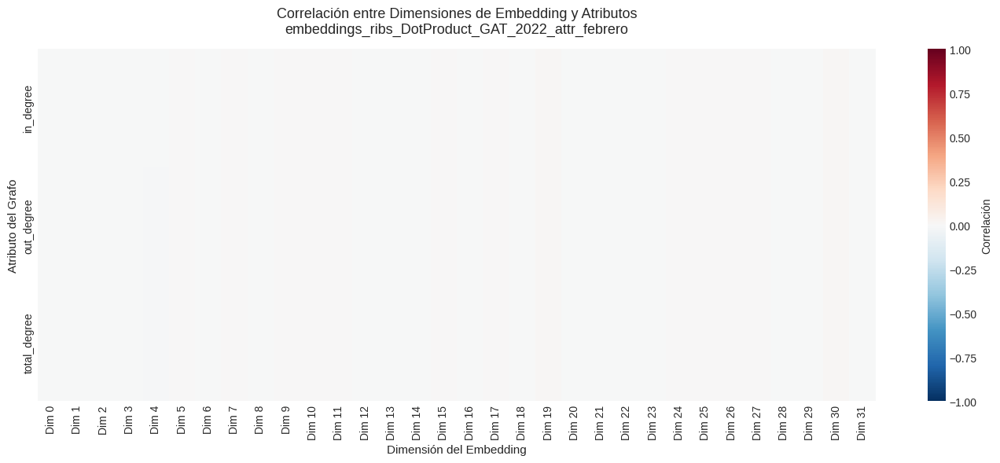

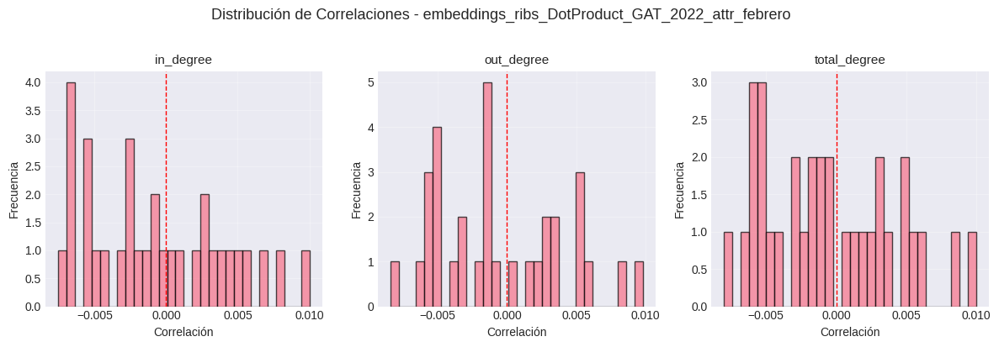


✓ Análisis de correlación completado

CORRELACIÓN 23/25: embeddings_ribs_MLP_GCN_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 3 → -0.0117
   • Correlación media (abs): 0.0053
   • Top 3 dimensiones correlacionadas:
      1. Dim 3: -0.0117
      2. Dim 12: 0.0105
      3. Dim 15: 0.0073

out_degree:
   • Correlación máxima: dim 3 → -0.0126
   • Correlación media (abs): 0.0058
   • Top 3 dimensiones correlacionadas:
      1. Dim 3: -0.0126
      2. Dim 12: 0.0108
      3. Dim 15: 0.0085

total_degree:
   • Correlación máxima: dim 3 → -0.0122
   • Correlación media (abs): 0.0056
   • Top 3 dimensiones correlacionadas:
      1. Dim 3: -0.0122
      2. Dim 12: 0.0107
      3. Dim 15: 0.0080

📈 Generando visualización...


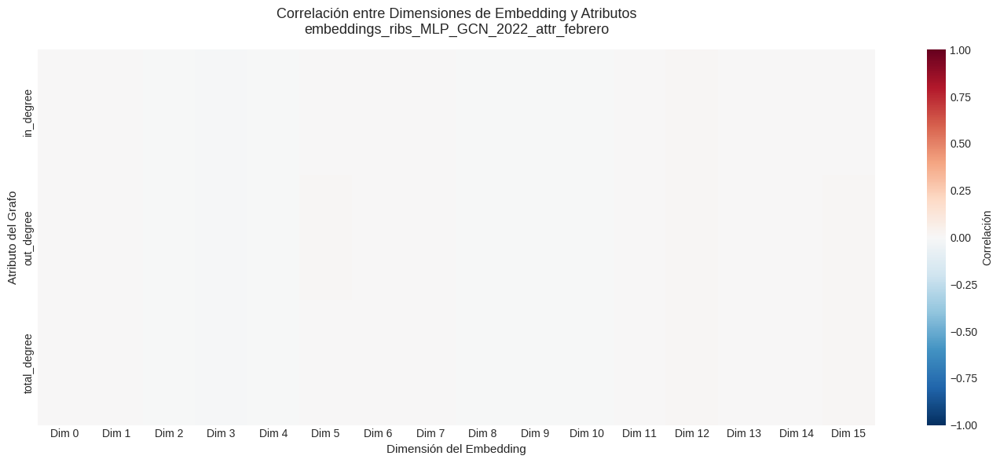

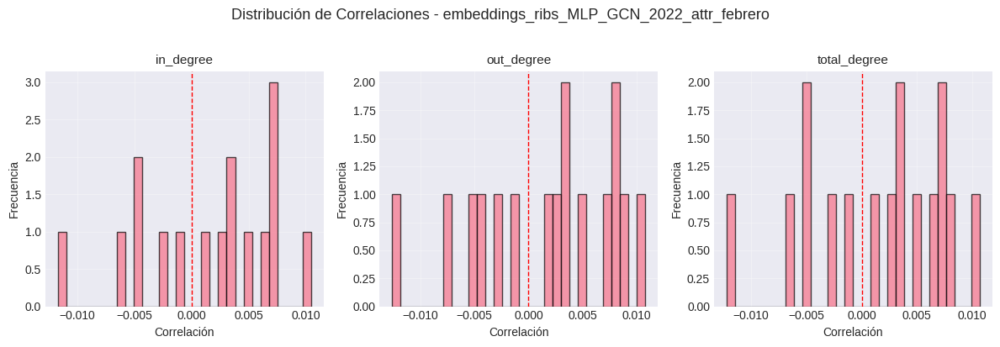


✓ Análisis de correlación completado

CORRELACIÓN 24/25: embeddings_ribs_MLP_GraphSAGE_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 4 → -0.0197
   • Correlación media (abs): 0.0067
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: -0.0197
      2. Dim 14: -0.0154
      3. Dim 15: -0.0132

out_degree:
   • Correlación máxima: dim 4 → -0.0206
   • Correlación media (abs): 0.0071
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: -0.0206
      2. Dim 14: -0.0151
      3. Dim 15: -0.0139

total_degree:
   • Correlación máxima: dim 4 → -0.0202
   • Correlación media (abs): 0.0069
   • Top 3 dimensiones correlacionadas:
      1. Dim 4: -0.0202
      2. Dim 14: -0.0153
      3. Dim 15: -0.0136

📈 Generando visualización...


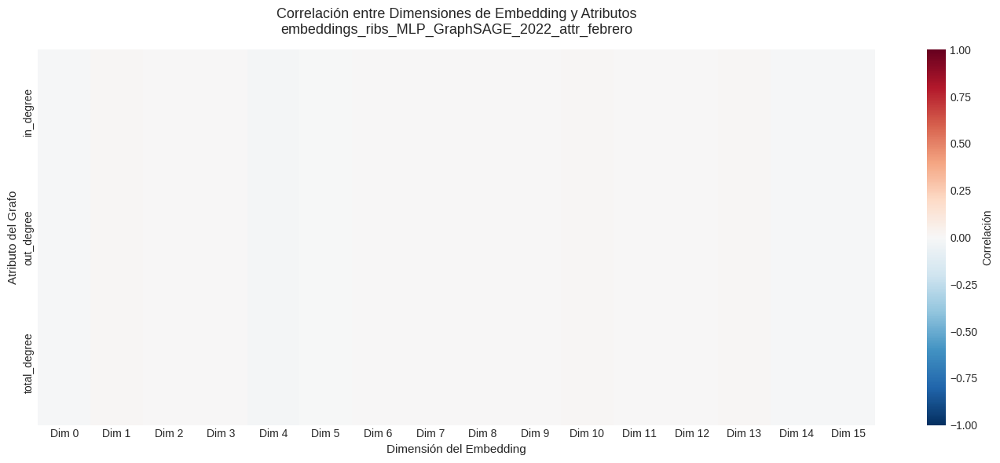

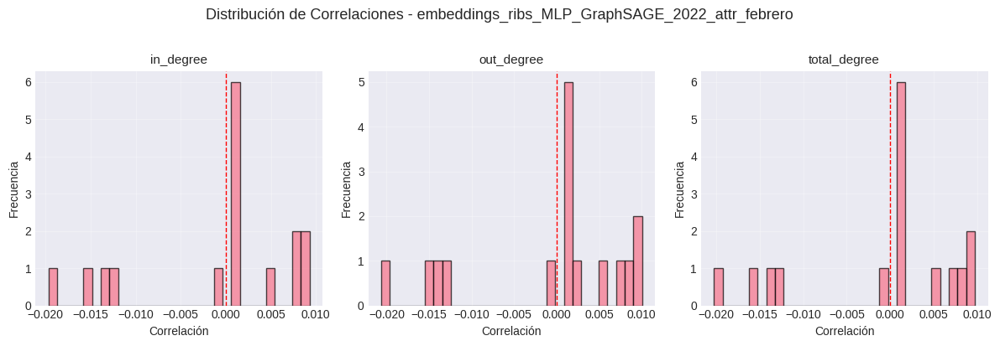


✓ Análisis de correlación completado

CORRELACIÓN 25/25: embeddings_ribs_MLP_GAT_2022_attr_febrero

⚠️  Advertencia: Mismatch en número de nodos
   Grafo: 41423, Embeddings: 46235
   Usando los primeros 41423 nodos

📊 Correlaciones (Dimensiones de Embedding vs Atributos):


in_degree:
   • Correlación máxima: dim 8 → 0.0124
   • Correlación media (abs): 0.0053
   • Top 3 dimensiones correlacionadas:
      1. Dim 8: 0.0124
      2. Dim 0: 0.0119
      3. Dim 2: 0.0104

out_degree:
   • Correlación máxima: dim 0 → 0.0126
   • Correlación media (abs): 0.0056
   • Top 3 dimensiones correlacionadas:
      1. Dim 0: 0.0126
      2. Dim 8: 0.0124
      3. Dim 2: 0.0110

total_degree:
   • Correlación máxima: dim 8 → 0.0124
   • Correlación media (abs): 0.0055
   • Top 3 dimensiones correlacionadas:
      1. Dim 8: 0.0124
      2. Dim 0: 0.0123
      3. Dim 2: 0.0107

📈 Generando visualización...


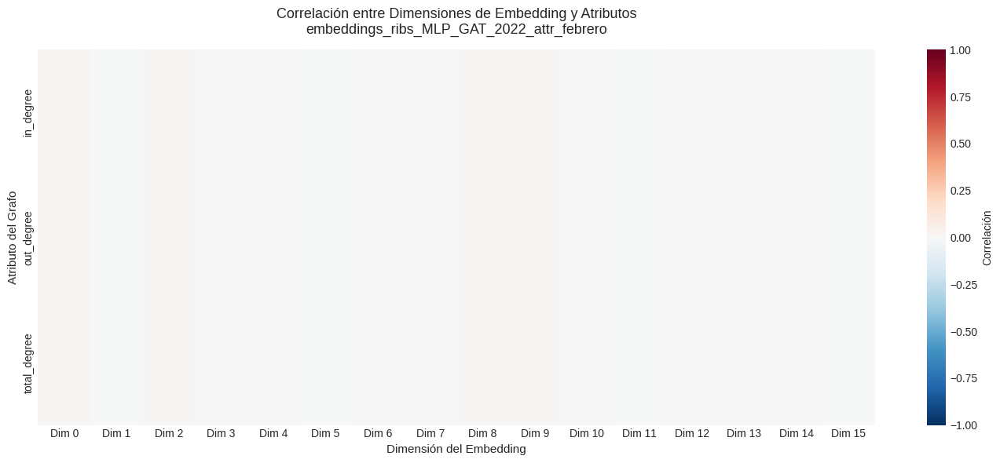

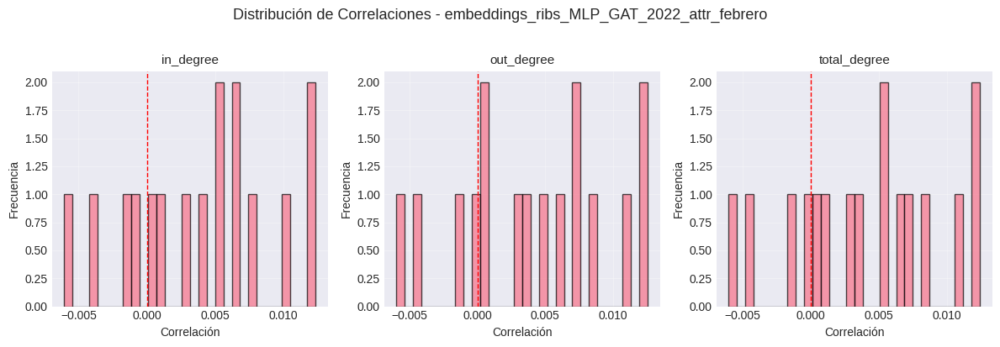


✓ Análisis de correlación completado

ANÁLISIS DE CORRELACIÓN COMPLETADO


In [13]:
# Procesar cada embedding
for idx, embeddings_path in enumerate(embeddings_to_analyze, 1):
    embeddings_name = embeddings_path.split('/')[-1].split('.')[0]
    
    print("\n" + "=" * 70)
    print(f"CORRELACIÓN {idx}/{len(embeddings_to_analyze)}: {embeddings_name}")
    print("=" * 70)
    
    try:
        # Cargar embeddings
        embeddings_pt = torch.load(embeddings_path)
        
        # Convertir a numpy si es necesario
        if isinstance(embeddings_pt, torch.Tensor):
            embeddings_np = embeddings_pt.cpu().detach().numpy()
        else:
            embeddings_np = embeddings_pt
        
        if g is not None:
            # Asegurarse de que las dimensiones coincidan
            num_nodes_graph = g.num_nodes()
            num_nodes_embeddings = embeddings_np.shape[0]
            
            if num_nodes_graph != num_nodes_embeddings:
                print(f"\n⚠️  Advertencia: Mismatch en número de nodos")
                print(f"   Grafo: {num_nodes_graph}, Embeddings: {num_nodes_embeddings}")
                min_nodes = min(num_nodes_graph, num_nodes_embeddings)
                print(f"   Usando los primeros {min_nodes} nodos")
            else:
                min_nodes = num_nodes_graph
            
            # Calcular atributos del grafo
            node_attrs = {
                'in_degree': g.in_degrees().numpy()[:min_nodes],
                'out_degree': g.out_degrees().numpy()[:min_nodes],
                'total_degree': (g.in_degrees() + g.out_degrees()).numpy()[:min_nodes]
            }
            
            # Agregar métricas si están disponibles
            if 'betweenness_centrality' in locals() and betweenness_centrality:
                node_attrs['betweenness'] = np.array([betweenness_centrality.get(i, 0) for i in range(min_nodes)])
            if 'pagerank' in locals() and pagerank:
                node_attrs['pagerank'] = np.array([pagerank.get(i, 0) for i in range(min_nodes)])
            if 'closeness_centrality' in locals() and closeness_centrality:
                node_attrs['closeness'] = np.array([closeness_centrality.get(i, 0) for i in range(min_nodes)])
            
            # Calcular correlaciones entre cada dimensión del embedding y cada atributo
            print("\n📊 Correlaciones (Dimensiones de Embedding vs Atributos):\n")
            
            correlations_summary = {}
            
            for attr_name, attr_values in node_attrs.items():
                print(f"\n{attr_name}:")
                correlations = []
                
                for dim in range(embeddings_np.shape[1]):
                    emb_dim = embeddings_np[:min_nodes, dim]
                    corr = np.corrcoef(emb_dim, attr_values)[0, 1]
                    correlations.append(corr)
                
                correlations = np.array(correlations)
                correlations_summary[attr_name] = correlations
                
                # Estadísticas
                max_corr_idx = np.argmax(np.abs(correlations))
                print(f"   • Correlación máxima: dim {max_corr_idx} → {correlations[max_corr_idx]:.4f}")
                print(f"   • Correlación media (abs): {np.mean(np.abs(correlations)):.4f}")
                print(f"   • Top 3 dimensiones correlacionadas:")
                
                top_dims = np.argsort(np.abs(correlations))[-3:][::-1]
                for i, dim_idx in enumerate(top_dims, 1):
                    print(f"      {i}. Dim {dim_idx}: {correlations[dim_idx]:.4f}")
            
            # Visualización: Heatmap de correlaciones
            print("\n📈 Generando visualización...")
            
            # Preparar datos para heatmap
            corr_matrix = np.array([correlations_summary[attr] for attr in node_attrs.keys()])
            
            plt.figure(figsize=(14, 6))
            sns.heatmap(corr_matrix, 
                        xticklabels=[f'Dim {i}' for i in range(embeddings_np.shape[1])],
                        yticklabels=list(node_attrs.keys()),
                        cmap='RdBu_r', 
                        center=0,
                        vmin=-1, 
                        vmax=1,
                        cbar_kws={'label': 'Correlación'})
            plt.title(f'Correlación entre Dimensiones de Embedding y Atributos\n{embeddings_name}', 
                      fontsize=13, pad=15)
            plt.xlabel('Dimensión del Embedding', fontsize=11)
            plt.ylabel('Atributo del Grafo', fontsize=11)
            plt.tight_layout()
            plt.show()
            
            # Distribución de correlaciones
            plt.figure(figsize=(12, 4))
            
            for i, (attr_name, corrs) in enumerate(correlations_summary.items(), 1):
                plt.subplot(1, len(correlations_summary), i)
                plt.hist(corrs, bins=30, alpha=0.7, edgecolor='black')
                plt.axvline(0, color='red', linestyle='--', linewidth=1)
                plt.xlabel('Correlación', fontsize=10)
                plt.ylabel('Frecuencia', fontsize=10)
                plt.title(attr_name, fontsize=11)
                plt.grid(True, alpha=0.3)
            
            plt.suptitle(f'Distribución de Correlaciones - {embeddings_name}', fontsize=13, y=1.02)
            plt.tight_layout()
            plt.show()
            
            print("\n✓ Análisis de correlación completado")
        
    except Exception as e:
        print(f"\n✗ Error al procesar {embeddings_name}: {str(e)}")
        continue

print("\n" + "=" * 70)
print("ANÁLISIS DE CORRELACIÓN COMPLETADO")
print("=" * 70)